In [1]:
# Initialize Notebook
from IPython.core.display import HTML,Image
#%run ../library/v1.0.5/init.ipy
HTML('''<script> code_show=true;  function code_toggle() {  if (code_show){  $('div.input').hide();  } else {  $('div.input').show();  }  code_show = !code_show }  $( document ).ready(code_toggle); </script> <form action="javascript:code_toggle()"><input type="submit" value="Toggle Code"></form>''')

In [2]:
import gc, argparse, sys, os, errno
from IPython.core.display import HTML,Image
from functools import reduce
import h5py
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm_notebook as tqdm
import scipy
import sklearn
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings('ignore')
from bokeh.io import output_notebook, show
output_notebook()
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.metrics import roc_curve,roc_auc_score,auc
from sklearn.preprocessing import RobustScaler,MinMaxScaler,StandardScaler
from sklearn.neighbors import NearestNeighbors
from bokeh.palettes import Category20c
from ipywidgets import interact,interactive, FloatSlider,IntSlider, RadioButtons,Dropdown,Tab,Text

Populating the interactive namespace from numpy and matplotlib


Loading BokehJS ...

In [22]:
def embed_pdf_figure(width='640', height='480', title='Image'):
    data = BytesIO()
    plt.savefig(data, format='pdf', metadata={'Title': title})
    data = data.getvalue()
    data = 'data:application/pdf;base64,'+ str(b64encode(data), encoding='utf-8')
    display(HTML('<object width="{}" height="{}" data="{}" download="{}.pdf"></object>'.format(
        width, height, data, title)))
    plt.close()
    

from matplotlib.backends.backend_pdf import PdfPages, PdfFile
from IPython.display import HTML, display, FileLink
from base64 import b64encode, b64decode
from io import StringIO, BytesIO
from contextlib import contextmanager

@contextmanager
def embed_pdf_pages(width=960, height=480, title='Image'):
    data = BytesIO()
    try:
        pdf = PdfPages(data, metadata={'Title': title})
        yield pdf
    finally:
        pdf.close()
        data = data.getvalue()
        data = 'data:application/pdf;base64,'+ str(b64encode(data), encoding='utf-8')
        display(HTML('<object width="{}" height="{}" data="{}"></object>'.format(width, height, data)))
        plt.close()

@contextmanager
def embed_pdf_data(width=640, height=480, title='Image'):
    try:
        data = BytesIO()
        yield data
    finally:
        data = data.getvalue()

        data = 'data:application/pdf;base64,'+ str(b64encode(data), encoding='utf-8')
        display(HTML('<object width="{}" height="{}" data="{}"></object>'.format(width, height, data)))
        plt.close()

fonttitle = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 8}
fontlabel = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 6.5}
fontticklabel = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 6.5}
fontlegend = {'family':'Arial',
                  'weight' : 'normal', 
              #'linewidth':0.5,
                  'size' : 6.5}
fontcbarlabel = {'family':'Arial',
                 'weight' : 'normal', 
                 #'Rotation' : 270,
                 #'labelpad' : 25,
                 'size' : 6.5}
fontcbarticklabel = {'family':'Arial',#Helvetica
                 'weight' : 'normal', 
                 'size' : 5.5}
def std_plot(ax,xlabel,ylabel,title=None,
             legendtitle=None,bbox_to_anchor=None,
             labelspacing=1.2,borderpad=0,handletextpad=0,legendsort=True,markerscale=None,
             xlim=None,ylim=None,
             xbins=None,ybins=None,
             cbar=None,cbarlabel=None,
             moveyaxis=False,sns=False,left=True,rotation=None):
    #plt.yticks([0,0.2,0.4,0.6,0.8,1.0],['0','0.2','0.4','0.6','0.8','1.0'])
    pyplot.draw()
    #plt.figure(linewidth=30.5)
    if xlim is not None:  
        ax.set(xlim=xlim)
    if ylim is not None:
        ax.set(ylim=ylim)
    #pyplot.draw()
    if xbins is not None:
        locator = MaxNLocator(nbins=xbins)
        locator.set_axis(ax.xaxis)
        ax.set_xticks(locator())
    if ybins is not None:
        locator = MaxNLocator(nbins=ybins)
        locator.set_axis(ax.yaxis)
        ax.set_yticks(locator())
    pyplot.draw()
    ax.set_xticks(ax.get_xticks())
    ax.set_yticks(ax.get_yticks())
    ax.set_xlabel(xlabel,fontdict = fontlabel,labelpad=5.5)
    ax.set_ylabel(ylabel,fontdict = fontlabel,labelpad=5.5)
    if rotation is not None:
        ax.set_xticklabels(ax.get_xticklabels(),fontticklabel,rotation=rotation)
    else:
        ax.set_xticklabels(ax.get_xticklabels(),fontticklabel)
    ax.set_yticklabels(ax.get_yticklabels(),fontticklabel)

    if moveyaxis is True:
        #fontticklabel 
        ax.spines['left'].set_position(('data',0))
    ax.spines['left'].set_visible(left)
    ax.spines['right'].set_visible(not left)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_linewidth(0.5)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)
    ax.spines['bottom'].set_color('k')
    ax.spines['left'].set_color('k')
    ax.spines['right'].set_color('k')
    
    ax.tick_params(direction='out', pad=2)
    #ax.spines['bottom']._edgecolor="#000000"
    #ax.spines['left']._edgecolor="#000000"
    if title is not None:
        ax.set_title(title,fontdict = fonttitle)
    if legendtitle is not None:
        #if legendloc is None:
        #    legendloc="best"
        legend = ax.legend(title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False,markerscale=markerscale)
        ax.legend_.get_frame()._linewidth=0.5
        legend.get_title().set_fontweight('normal')
        legend.get_title().set_fontsize(6.5)
        if legendsort is True:
            # h: handle l:label
            h,l = ax.get_legend_handles_labels()
            l,h = zip(*sorted(zip(l,h), key=lambda t: int(t[0]))) 
            legend = ax.legend(h,l,title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False,markerscale=markerscale)
            ax.legend_.get_frame()._linewidth=0.5
            legend.get_title().set_fontweight('normal')
            legend.get_title().set_fontsize(6.5)
        if sns is True:
            h,l = ax.get_legend_handles_labels()
            #l,h = zip(*sorted(zip(l,h), key=lambda t: int(t[0]))) 
            legend = ax.legend(h[1:],l[1:],title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False,markerscale=markerscale)
            ax.legend_.get_frame()._linewidth=0.5
            legend.get_title().set_fontweight('normal')
            legend.get_title().set_fontsize(6.5)

    if cbar is not None:
        #locator, formatter = cbar._get_ticker_locator_formatter()
        #ticks, ticklabels, offset_string = cbar._ticker(locator, formatter)
        #cbar.ax.spines['top'].set_visible(False)
        #cbar.ax.spines['right'].set_visible(False)
        #cbar.ax.spines['bottom'].set_visible(False)
        #cbar.ax.spines['left'].set_visible(False)
        cbar.ax.tick_params(direction='out', pad=3,width=0,length=0)
        cbar.set_label(cbarlabel,fontdict = fontcbarlabel,Rotation=270,labelpad=7.5)
        cbar.ax.set_yticks(cbar.ax.get_yticks())
        cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(),fontcbarticklabel)
    return ax

def gradient_func(val):
    return '<span style="background: linear-gradient(90deg, #d65f5f {0}%, transparent 0%)">{0:.3f}</span>'.format(val)

def display_dataframe(df, filename=None, encoding='utf-8', format='csv', type='button',gradientfunc=False, **kwargs):
    #display(df)
    #if isinstance(df, pd.DataFrame):
    #    display(df.style.set_caption(filename))
    #else:
    if gradientfunc == False:
        display(df.style.set_caption(filename))    
    else:
        display(df.style.format(gradient_func).set_caption(filename)) 
    if filename is None:
        filename = "dataframe"
    if format == 'csv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/csv'
        filename = filename + '.csv'
    elif format == 'tsv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/plain'
        filename = filename + '.txt'
    else:
        raise ValueError('unknown file format: {}'.format(format))
    data = 'data:{mime_type};base64,'.format(mime_type=mime_type) + str(b64encode(bytes(data, encoding=encoding)), encoding=encoding)
    if type == 'hyperlink':
        display(HTML('<a href=" " download={filename} target="_blank">{filename}</a >'.format(
            mime_type=mime_type, filename=filename, data=data)))
    elif type == 'button':
        button_id = 'button_{}'.format(np.random.randint(1000000000))
        display(HTML(r'<input type="button" id="{0}" value="Download">'.format(button_id)))
        display(HTML('''<script>
    document.getElementById("{button_id}").addEventListener("click", function(event){{
        var filename = "{filename}";
        var data = "{data}";
        const element = document.createElement('a');
        element.setAttribute('href', data);
        element.setAttribute('download', filename);
        element.style.display = 'none';
        document.body.appendChild(element);
        element.click();
        document.body.removeChild(element);
    }});
</script>'''.format(button_id=button_id, filename=filename, data=data)))
        
def log_transfrom(data,small=0.01):
    return np.log2(data+small)

In [4]:
cd ~/ex

/home/xieyufeng/ex


In [5]:
def interactive_config_settings(dataset,sequencing_type,classifier,value_change,example_cancer,reads_preprocess,stage_info,saveformat):
    if sequencing_type == 'short':
        exp_mx_name = 'domains_combined'
    elif sequencing_type =='long':
        exp_mx_name = 'featurecounts'
    elif sequencing_type =='domain_only':
        exp_mx_name = 'domains_long'
    elif sequencing_type =='transcript':
        exp_mx_name = 'transcript'
    elif sequencing_type =='transcript_small':
        exp_mx_name = 'transcript_small'
    elif sequencing_type =='transcript_long_bg':
        exp_mx_name = 'transcript_long_bg'
    return dataset,sequencing_type,classifier,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info,saveformat

widget =interactive(interactive_config_settings,
           dataset= ['scirep','exorbase','exosome_small','pico_3v3'],
           sequencing_type=['short','long','domain_only','transcript','transcript_small','transcript_long_bg'],
           classifier = ['random_forest','logistic_regression','linear_svm','decision_tree','logistic_regression_l1'],
           value_change = ['any','up','down'],
        example_cancer=['Normal-CRC','Normal-PAAD','Normal-PRAD','Normal-HCC'],
                   reads_preprocess=[True,False],
                   stage_info = ['No Stage','With Stage'],
                   saveformat=['.pdf','.eps'])  # if start from preprocessing
display(widget)


interactive(children=(Dropdown(description='dataset', options=('scirep', 'exorbase', 'exosome_small', 'pico_3v3'), value='scirep'), Dropdown(description='sequencing_type', options=('short', 'long', 'domain_only', 'transcript', 'transcript_small', 'transcript_long_bg'), value='short'), Dropdown(description='classifier', options=('random_forest', 'logistic_regression', 'linear_svm', 'decision_tree', 'logistic_regression_l1'), value='random_forest'), Dropdown(description='value_change', options=('any', 'up', 'down'), value='any'), Dropdown(description='example_cancer', options=('Normal-CRC', 'Normal-PAAD', 'Normal-PRAD', 'Normal-HCC'), value='Normal-CRC'), Dropdown(description='reads_preprocess', options=(True, False), value=True), Dropdown(description='stage_info', options=('No Stage', 'With Stage'), value='No Stage'), Dropdown(description='saveformat', options=('.pdf', '.eps'), value='.pdf'), Output()), _dom_classes=('widget-interact',))

In [6]:
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info,saveformat = widget.result
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info,saveformat

('scirep',
 'short',
 'random_forest',
 'any',
 'domains_combined',
 'Normal-CRC',
 True,
 'No Stage',
 '.pdf')

In [7]:
file_counts = 'output/'+dataset+'/summary/read_counts.txt'
file_length_path = 'output/'+dataset+'/stats/mapped_read_length_by_sample/'
file_length_path_insert = 'output/'+dataset+'/stats/mapped_insert_size_by_sample/'
plot_save_path = 'output/'+dataset+'/plots/'

    
import datetime
now = datetime.datetime.now()
timenow = '{}.{}.{}.{}:{}'.format(now.year,now.month,now.day,now.hour,now.minute)
savepath = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'
save_path = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'

if not os.path.exists(savepath):
    os.mkdir(savepath)

# Basic plot

In [182]:
#Get table
def get_counts_ratio_table(file_counts,sequencing_type='short'):
    df = pd.read_table(file_counts, index_col=0)
    if reads_preprocess == True:
        if sequencing_type == 'short':
            rna_types = [s.split('.')[0] for s in df.index.tolist() if s.endswith('.mapped')]
            rna_types = 'rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other'.split(',')
            mapped_ratio = {}
            mapped_count = {}
            for sample_id in df.columns.tolist():
                mapped_ratio[sample_id] = {}
                mapped_count[sample_id] = {}
                clean_counts = float(df.loc['clean.unmapped', sample_id])
                for rna_type in rna_types:
                    mapped_ratio[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]/(
                        clean_counts - df.loc['other.unmapped', sample_id])
                    mapped_count[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]
                for region in ('promoter', 'enhancer', 'intron','repeats','circRNA'):
                    mapped_ratio[sample_id]['other'] -= mapped_ratio[sample_id][region]
                    mapped_count[sample_id]['other'] -= mapped_count[sample_id][region]
            mapped_count = pd.DataFrame.from_records(mapped_count)        
            mapped_ratio = pd.DataFrame.from_records(mapped_ratio)
            mapped_count = mapped_count.loc[rna_types, :]
            mapped_ratio = mapped_ratio.loc[rna_types, :]
            return df,mapped_count.T, mapped_ratio.T
        elif sequencing_type =='long':
            read_counts = pd.read_table(file_counts, index_col=0)
            read_counts = read_counts.T

            rna_types = read_counts.columns.tolist()
            rna_types.remove('clean')
            rna_types_included = list(rna_types)
            for rna_type in ('genome', 'rRNA'):
                rna_types_included.remove(rna_type)

            # percentage by clean reads
            #display(read_counts.style.set_caption('Read counts'))

            percent_by_clean = read_counts.loc[:, ['clean', 'rRNA', 'genome', 'circRNA']].copy()
            percent_by_clean = 100.0*percent_by_clean.div(percent_by_clean.loc[:, 'clean'], axis=0)
            percent_by_clean.drop(columns='clean', inplace=True)
            percent_by_clean['unmapped'] = 100 - percent_by_clean.sum(axis=1)
            #display(percent_by_clean.style.format(gradient_func).set_caption('Percentage by clean reads'))

            percent_by_mapped = read_counts.copy()
            percent_by_mapped = 100.0*percent_by_mapped.div(percent_by_mapped.loc[:, ['genome', 'circRNA']].sum(axis=1), axis=0)
            percent_by_mapped.drop(columns=['rRNA', 'genome', 'clean'], inplace=True)
            percent_by_mapped['other'] = 100.0 - percent_by_mapped.sum(axis=1)
            #display(percent_by_mapped.style.format(gradient_func).set_caption('Percentage by mapped reads'))
            return read_counts,percent_by_clean,percent_by_mapped
    else:
        if sequencing_type == 'short':
            pass
        elif sequencing_type =='long':
            read_counts = pd.read_table(file_counts, index_col=0)
            read_counts = read_counts.T

            rna_types = read_counts.columns.tolist()
            rna_types.remove('clean')
            rna_types_included = list(rna_types)
            for rna_type in ('genome', 'rRNA'):
                rna_types_included.remove(rna_type)

            # percentage by clean reads
            #display(read_counts.style.set_caption('Read counts'))

            percent_by_clean = read_counts.loc[:, ['clean', 'rRNA', 'genome', 'circRNA']].copy()
            percent_by_clean = 100.0*percent_by_clean.div(percent_by_clean.loc[:, 'clean'], axis=0)
            percent_by_clean.drop(columns='clean', inplace=True)
            percent_by_clean['unmapped'] = 100 - percent_by_clean.sum(axis=1)
            #display(percent_by_clean.style.format(gradient_func).set_caption('Percentage by clean reads'))

            percent_by_mapped = read_counts.copy()
            percent_by_mapped = 100.0*percent_by_mapped.div(percent_by_mapped.loc[:, ['genome', 'circRNA']].sum(axis=1), axis=0)
            percent_by_mapped.drop(columns=['rRNA', 'genome', 'clean'], inplace=True)
            percent_by_mapped['other'] = 100.0 - percent_by_mapped.sum(axis=1)
            #display(percent_by_mapped.style.format(gradient_func).set_caption('Percentage by mapped reads'))
            return read_counts,percent_by_clean,percent_by_mapped
        

In [183]:
def get_length_table(file_length_path,sequencing_type='short'):
    length_table = {}
    for i in os.listdir(file_length_path):
        if sequencing_type =='short':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:52]
        elif sequencing_type =='long':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:152]
    sample_names = np.array(os.listdir(file_length_path))
    length_table_sum = length_table[sample_names[0]]
    for i in sample_names[1:]:
        length_table_sum += length_table[i]
    return length_table_sum/length_table_sum.sum(axis=0)

In [184]:
if sequencing_type == 'short': 
    read_counts,table_count, table_ratio = get_counts_ratio_table(file_counts)
    length_table = get_length_table(file_length_path,sequencing_type=sequencing_type)
    rnanames=np.array(table_ratio.columns).astype('str')
elif sequencing_type == 'long': 
    read_counts,percent_by_clean,percent_by_mapped = \
                    get_counts_ratio_table(file_counts,sequencing_type='long')
    rnanames_1=np.array(percent_by_clean.columns).astype('str')
    rnanames_2=np.array(percent_by_mapped.columns).astype('str')
    length_table_1 = get_length_table(file_length_path,sequencing_type=sequencing_type)
    length_table_2 = get_length_table(file_length_path_insert,sequencing_type=sequencing_type)

In [49]:
if sequencing_type == 'short': 
    table_percent = table_ratio*100
    display_dataframe(table_count,filename='Mapped counts',gradientfunc=False)
    display_dataframe(table_percent,filename='Percentage by clean reads',gradientfunc=True)
elif sequencing_type == 'long': 
    display_dataframe(read_counts,filename='Read counts',gradientfunc=False)
    display_dataframe(percent_by_clean,filename='Percentage by clean reads',gradientfunc=True)
    display_dataframe(percent_by_mapped,filename='Percentage by mapped reads',gradientfunc=True)

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,2710145,2367858,2231703,159856,10063,1192989,72924,3161,50810,43985,15358,14683,18811,94482,131789,106,123532
Sample_1S10,1629968,2451143,2103127,88542,6048,931195,30802,2062,44639,40118,15321,13011,17792,97522,119503,90,148167
Sample_1S11,2272879,2824300,2436573,127084,8580,966880,45675,2884,60928,56902,21435,18018,24105,131103,151540,149,212277
Sample_1S12,3030702,2979583,2456711,144582,12183,1070268,59131,4395,53842,44830,13799,13926,21054,96823,138275,106,80860
Sample_1S13,1778928,2501530,2760974,89736,6507,1790410,43011,2848,42612,29171,10634,11857,12715,64569,99143,64,76453
Sample_1S14,2197443,1946642,3302499,105208,8307,1870826,48432,11469,47500,29478,10894,12070,13735,69761,116931,85,76892
Sample_1S15,1517066,1509001,2653245,87267,5619,1548449,29950,2063,38637,25290,10008,10798,11706,61580,96194,75,73083
Sample_1S16,1919819,2473806,2690755,120872,6775,1429103,39193,2814,44822,34236,12671,12423,14650,77495,114293,82,96340
Sample_1S17,3053709,2529547,3287205,143721,10873,1613219,60127,3880,56579,41107,13741,15784,18812,101591,150893,138,97079
Sample_1S18,1888862,1687399,2106196,99025,6954,1074847,40128,2761,51276,42820,15698,14413,18072,91231,117204,118,129377


,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,29.323,25.620,24.147,1.730,0.109,12.908,0.789,0.034,0.550,0.476,0.166,0.159,0.204,1.022,1.426,0.001,1.337
Sample_1S10,21.062,31.672,27.176,1.144,0.078,12.032,0.398,0.027,0.577,0.518,0.198,0.168,0.230,1.260,1.544,0.001,1.915
Sample_1S11,24.279,30.170,26.028,1.358,0.092,10.328,0.488,0.031,0.651,0.608,0.229,0.192,0.257,1.400,1.619,0.002,2.268
Sample_1S12,29.652,29.151,24.036,1.415,0.119,10.471,0.579,0.043,0.527,0.439,0.135,0.136,0.206,0.947,1.353,0.001,0.791
Sample_1S13,19.085,26.837,29.620,0.963,0.070,19.208,0.461,0.031,0.457,0.313,0.114,0.127,0.136,0.693,1.064,0.001,0.820
Sample_1S14,22.268,19.726,33.466,1.066,0.084,18.958,0.491,0.116,0.481,0.299,0.110,0.122,0.139,0.707,1.185,0.001,0.779
Sample_1S15,19.753,19.648,34.547,1.136,0.073,20.162,0.390,0.027,0.503,0.329,0.130,0.141,0.152,0.802,1.253,0.001,0.952
Sample_1S16,21.120,27.214,29.601,1.330,0.075,15.721,0.431,0.031,0.493,0.377,0.139,0.137,0.161,0.853,1.257,0.001,1.060
Sample_1S17,27.270,22.589,29.355,1.283,0.097,14.406,0.537,0.035,0.505,0.367,0.123,0.141,0.168,0.907,1.347,0.001,0.867
Sample_1S18,25.572,22.845,28.515,1.341,0.094,14.552,0.543,0.037,0.694,0.580,0.213,0.195,0.245,1.235,1.587,0.002,1.752


## pie plot of RNA ratio

In [50]:
def plot_pie(data, rnanames):
    '''
    data: table_ratio
    rnanames: rna type names
    adjustment: merge RNA with small percent together
    '''
    from bokeh.io import output_file, show
    from bokeh.palettes import Category20
    from bokeh.plotting import figure
    from bokeh.transform import cumsum
    x = np.array(rnanames)
    y = np.array(data.loc[:,x].mean())+10e-8
    z_ = np.array([x[i] + str(' {:.2f}'.format(y[i]*100)+'%') for i in range(y.shape[0])])
    z = np.array([float('{:.10f}'.format(y[i]*100)) for i in range(y.shape[0])])
    labels = rnanames
    dataframe = pd.DataFrame(np.concatenate((x.reshape(-1,1),z.reshape(-1,1),z_.reshape(-1,1)),axis=1))
    dataframe.columns=['rna','percent','label']
    dataframe["percent"] = pd.to_numeric(dataframe["percent"])
    dataframe['angle'] = dataframe['percent']/dataframe['percent'].sum() * 2*pi
    dataframe['color'] = Category20[len(x)]
    p = figure(plot_height=500,width=750, title="Pie Chart", toolbar_location=None,
               tools="hover", tooltips="@label", x_range=(-0.5, 1.0))
    p.wedge(x=0.14, y=1, radius=0.45,
            start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
            line_color="black", fill_color='color', legend="label", source=dataframe)
    p.axis.axis_label=None
    p.axis.visible=False
    p.grid.grid_line_color = None
    show(p)
def plot_for_pie(sequencing_type=sequencing_type,by_sample=False):
    if by_sample:
        if sequencing_type == 'short': 
            for i in range(table_ratio.shape[0]):
                plot_pie(pd.DataFrame(table_ratio.iloc[i]).T, rnanames)
        elif sequencing_type == 'long': 
            for i in range(percent_by_mapped.shape[0]):
                plot_pie(pd.DataFrame(percent_by_mapped.iloc[i]/100.).T, rnanames_2)
    else:
        if sequencing_type == 'short': 
            plot_pie(table_ratio, rnanames)
        elif sequencing_type == 'long': 
            plot_pie(percent_by_mapped/100. , rnanames_2)
            
plot_for_pie(sequencing_type=sequencing_type,by_sample=False)

## boxplot of rna ratio

In [51]:
def plot_ratio_boxplot(data, rnanames, points_show = True, width=20, height=10, savefig=False):
    '''
    data: table_ratio
    rnanames: rna type names
    points_show: plot scatter points too
    '''
    fig, ax = plt.subplots(figsize=(width, height))
    sns.boxplot(data = data,ax=ax,boxprops=dict(alpha=.001),color='gray',width=0.65,saturation=0.01)
    if points_show:
        sns.stripplot(data = data,ax=ax,size=2, edgecolor='black')
    
    ax.set_xticklabels(rnanames,rotation=90)
    std_plot(ax,'type','percentage',ylim=[0,np.ceil(np.max(np.max(data))*10)/10])
    #ax.set_yticklabels(['{:.1f}%'.format((i-1)*10) for i in range(10)],fontsize=20,fontweight='bold')
    fig.tight_layout()
    if savefig:
        fig.savefig(save_path+'rna_ratio_box_plot.png', bbox_inches='tight')
    #plt.figure(linewidth=30.5)
    #ax.spines['right'].set_visible(False)
    #ax.spines['top'].set_visible(False)

if sequencing_type == 'long': 
    plot_ratio_boxplot(percent_by_mapped/100, rnanames_2, points_show = True, 
               width=7, height=5, savefig=1)
else: 
    plot_ratio_boxplot(table_ratio, rnanames, points_show = True, width=7, height=5, savefig=1)
embed_pdf_figure()

## line plot of rna length

In [52]:
def plot_length_line(data, rnanames, width=7, height=20, savefig=False):
    '''
    data: length_table
    rnanames: rna type names
    '''
    data=data.fillna(0)
    length = np.array(data.T)
    fig,ax=plt.subplots(length.shape[0],1,figsize=(width, height))
    for i in range(length.shape[0]):
        ax[i].plot(length[i],label=data.columns[i], color=Category20c[20][i],linewidth=1)
        ax[i].legend(loc='upper right')
        ax[i].set_xticks(np.arange(0, data.shape[0],5))
        ax[i].set_xticklabels(np.arange(data.index[0], data.index[-1]+5,5))
        std_plot(ax[i],'','',ylim=[0,max(length[i])],ybins=5)
        legend = ax[i].legend(prop=fontlegend,
              bbox_to_anchor=None,
              borderpad=1,
              edgecolor="#000000",fancybox=False)
        ax[i].legend_.get_frame()._linewidth=0.5
        legend.get_title().set_fontweight('normal')
        legend.get_title().set_fontsize(6.5)
        #ax[i].set(ylim=[0,1])
        #if i != 10:
        #    ax[i].spines['bottom'].set_visible(False)
        #    ax[i].set_xticks([])
    if savefig:
        fig.savefig(save_path+'rna_length_line_plot'+saveformat, bbox_inches='tight')
    fig.tight_layout()
    embed_pdf_figure()

In [53]:
if sequencing_type == 'long': 
    plot_length_line(length_table_1, rnanames_1, width=7, height=length_table_1.shape[1], savefig=1)
    plot_length_line(length_table_2, rnanames_2, width=7, height=length_table_2.shape[1], savefig=1)
else: 
    plot_length_line(length_table, rnanames, width=7, height=length_table.shape[1], savefig=1)

## 3D barplot of rna length

In [54]:
from mpl_toolkits.mplot3d import Axes3D
def plot_3d(data, width=7, height=5,  azim = 45, elev = 32,savefig=False):
    '''
    data: length_table
    '''
    #data = length_table
    data=data.fillna(0)
    fig = plt.figure(figsize=(width,height))
    ax1 = fig.gca(projection="3d")
    num = data.shape[1]
    count_ = data.shape[0]
    xpos = np.repeat(np.arange(1,count_+1),num).reshape(count_,-1).T.ravel()
    ypos = np.repeat(range(num),count_).ravel()
    num_elements = len(xpos)
    zpos = np.zeros(count_*num)
    dx = np.ones(count_*num)/5
    dy = np.ones(count_*num)/5
    dz = np.array(data.T).ravel()
    
    for i in range(num):
        ax1.bar3d(xpos[count_*i:count_*(i+1)], ypos[count_*i:count_*(i+1)], zpos[count_*i:count_*(i+1)],
                  dx[count_*i:count_*(i+1)], dy[count_*i:count_*(i+1)],dz[count_*i:count_*(i+1)], color=(np.array(Category20c[20]))[:num][i],alpha=0.9)
    plt.xticks(range(count_), [str(i+16) for i in range(count_)], size=6.5,color='red',weight='normal',family='Arial',rotation=-azim)
    ax1.set_yticks(range(num))
    ax1.set_yticklabels(data.columns, color='blue',weight='normal',family='Arial', size=6.5)
    fig.canvas.draw()
    ax1.set_zticks(ax1.get_zticks())
    ax1.set_zticklabels(ax1.get_zticklabels(),weight='normal',family='Arial', size=6.5)
    for color,tick in zip((Category20c[20])[:num],ax1.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    ax1.view_init(azim=azim,elev=elev)  
    ax1.xaxis.pane.fill = False
    ax1.yaxis.pane.fill = False
    ax1.zaxis.pane.fill = False
    ax1.xaxis.pane.set_edgecolor('w')
    ax1.yaxis.pane.set_edgecolor('w')
    ax1.zaxis.pane.set_edgecolor('w')
    fig.tight_layout()
    if savefig:
        fig.savefig(save_path+'rna_length_3D_barplot'+saveformat, bbox_inches='tight')

In [55]:
if sequencing_type == 'long': 
    plot_3d(length_table_1,width=7, height=5, savefig=1, azim = 45, elev = 32)
    embed_pdf_figure()
    plot_3d(length_table_2,width=7, height=5, savefig=1, azim = 45, elev = 32)
    embed_pdf_figure()
else:
    plot_3d(length_table,width=7, height=5, savefig=True, azim = 45, elev = 32)
    embed_pdf_figure()

## stack bar plot of rna counts and ratio

In [56]:
from matplotlib.colors import LinearSegmentedColormap
def stack_bar_ratio(table, ax,statistics = 'ratio',savefig=1):   
    
    table.plot(kind='bar', stacked=True,ax=ax,width=0.5,
                legend=True,colormap=matplotlib.colors.ListedColormap ( Category20c[20]))
    #ax.legend(bbox_to_anchor=(1,1),fontsize='large')#, loc="lower right",
    #ax.set_title('Stacked Bar plot',fontsize=40)
    if savefig:
        fig.savefig(save_path+statistics+'_stack_barplot'+saveformat, bbox_inches='tight')
    return ax

In [57]:
fig,ax=plt.subplots(figsize=(14,4))
if sequencing_type == 'long': 
    ax = stack_bar_ratio(percent_by_mapped/100.,ax=ax)
else:
    ax = stack_bar_ratio(table_ratio,ax=ax)

std_plot(ax,'sample','percentage',legendtitle='type',legendsort=False,ylim=[0,1],bbox_to_anchor=(1,1),borderpad=0.2)
fig.tight_layout()
embed_pdf_figure()

In [58]:
fig,ax=plt.subplots(figsize=(14,4))
    
if sequencing_type == 'long': 
    ax = stack_bar_ratio(read_counts,ax=ax)
else:
    ax = stack_bar_ratio(table_count,ax=ax)

std_plot(ax,'sample','counts(1e7)',legendtitle='type',legendsort=False,bbox_to_anchor=(1,1),borderpad=0.2)
fig.tight_layout()
embed_pdf_figure()

## bar plot of RNA by sample

In [59]:
def plot_bar_by_rna(fig,ax,table,rnaname,savefig=1, statistics = 'ratio',height = 4, width=20):
    '''
    table: ratio or count table, rows are rna type
    statistics: ratio or count
    '''
    table = table.T
    count = np.array(table[table.index ==rnaname]).ravel()
    #fig,ax=plt.subplots(1,figsize=(width,height))
    counttable =  pd.DataFrame(np.concatenate((np.arange(1,table.shape[1]+1).reshape(-1,1),
                count[np.argsort(-count)].reshape(-1,1)),axis=1),columns=['sample',statistics])
    
    sns.barplot(ax=ax,x='sample',y=statistics,data = counttable,color=Category20c[20][np.random.randint(0,20)],alpha=1)
    ax.set_xticks(np.arange(0,table.shape[1],5))
    ax.set_xticklabels(np.arange(0,table.shape[1],5))
    ax.set_title(statistics+' of '+rnaname,fontsize=15)
    if savefig:
        fig.savefig(save_path+'sample_'+rnaname+'_'+statistics+'_bar_plot'++saveformat, bbox_inches='tight')

In [60]:
def plot_bar_by_rna_total(table,datatype='ratio'):
    fignum= table.columns.shape[0]
    fig,ax=plt.subplots(fignum ,1,figsize=(7 , 24 ))
    for i in range(fignum):
        plot_bar_by_rna(fig,ax[i],table,table.columns[i],statistics = datatype)
        std_plot(ax[i],'sample','ratio',datatype+' of '+table.columns[i])
    fig.tight_layout()

In [61]:
if sequencing_type == 'long': 
    plot_bar_by_rna_total(percent_by_mapped/100.,datatype='ratio')
else: 
    plot_bar_by_rna_total(table_ratio,datatype='ratio')


embed_pdf_figure()

In [62]:
if sequencing_type == 'long': 
    plot_bar_by_rna_total(percent_by_mapped/100.,datatype='count')
else: 
    plot_bar_by_rna_total(table_ratio,datatype='count')


embed_pdf_figure()

## FastQC

In [63]:
summary = pd.read_table('output/'+dataset+'/summary/fastqc.txt', sep='\t')
qc_status = summary.iloc[:, 9:]
qc_status.fillna('NA')
qc_status = qc_status.astype('str')
sample_ids = summary.sample_id
sections = qc_status.columns.values
def style_func(val):
    status, row, col = val.split('|')
    row, col = int(row), int(col)
    color = {'pass': 'green', 'fail': 'red', 'warn': 'orange'}.get(status, 'gray')
    return '<a href="../output/'+dataset+'/fastqc/{sample_id}_fastqc.html#M{section}" style="color: {color}">{status}</a>'.format(
        sample_id=sample_ids[row], color=color, status=status, section=col + 1)

pd.DataFrame(qc_status.values \
             + '|' + np.arange(qc_status.shape[0]).astype('str')[:, np.newaxis] \
             + '|' + np.arange(qc_status.shape[1]).astype('str')[np.newaxis, :],
             index=qc_status.index, columns=qc_status.columns) \
    .style.format(style_func)

,Basic Statistics,Per base sequence quality,Per tile sequence quality,Per sequence quality scores,Per base sequence content,Per sequence GC content,Per base N content,Sequence Length Distribution,Sequence Duplication Levels,Overrepresented sequences,Adapter Content,Kmer Content
0,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
1,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
2,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
3,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,fail
4,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
5,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
6,pass,pass,pass,pass,fail,fail,pass,pass,fail,fail,fail,fail
7,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
8,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
9,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan


## Sample QC
use PCA and tSNE to visualize outliters

In [64]:
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'
original_mx = pd.read_table(original_mx_file,index_col=0)

In [68]:
def PCA_plot_basic(ax,data,sampleclass,method = 'PCA'):
    X = log_transfrom(data).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.columns = ['dimension_1','dimension_2']
    g = sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                   s=50)
    return g
    #plt.figure(linewidth=30.5)
    #ax.spines['right'].set_visible(False)
    #ax.spines['top'].set_visible(False)
def sample_qc_visualize_outlier(original_mx,table_ratio,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(7, 4))
    if method=='PCA':
        method_PCA = True
    elif method=='tSNE':
        method_PCA = False
    g = PCA_plot_basic(ax[0],original_mx, method_PCA)
    std_plot(g,'Dimension 1','Dimension 2','Original matrix')
    g = PCA_plot_basic(ax[1],table_ratio, method_PCA)
    std_plot(g,'Dimension 1','Dimension 2','Table ratio')
    embed_pdf_figure()

In [69]:
sample_qc_visualize_outlier(original_mx,table_ratio.T,method='tSNE')

In [67]:
table_ratio.T

,Sample_1S1,Sample_1S10,Sample_1S11,Sample_1S12,Sample_1S13,Sample_1S14,Sample_1S15,Sample_1S16,Sample_1S17,Sample_1S18,...,Sample_PC6,Sample_PC7,Sample_PC8,Sample_PC9,Sample_Pan01,Sample_Pan02,Sample_Pan03,Sample_Pan04,Sample_Pan05,Sample_Pan06
rRNA,0.293234,0.210616,0.242795,0.296515,0.190848,0.222680,0.197534,0.211198,0.272701,0.255722,...,0.286498,0.274886,0.246255,0.220379,0.175726,0.156412,0.199696,0.215663,0.195998,0.172571
miRNA,0.256199,0.316724,0.301699,0.291514,0.268371,0.197265,0.196484,0.272141,0.225893,0.228447,...,0.300526,0.300817,0.300837,0.360915,0.230501,0.256986,0.313966,0.299613,0.275755,0.223489
piRNA,0.241467,0.271755,0.260281,0.240358,0.296205,0.334662,0.345473,0.296008,0.293553,0.285146,...,0.217283,0.175049,0.229936,0.220194,0.358054,0.357745,0.306429,0.290481,0.328777,0.371637
Y_RNA,0.017296,0.011441,0.013575,0.014145,0.009627,0.010661,0.011363,0.013297,0.012835,0.013406,...,0.012478,0.017930,0.012153,0.015588,0.010035,0.014082,0.010548,0.011319,0.015720,0.010284
srpRNA,0.001089,0.000781,0.000917,0.001192,0.000698,0.000842,0.000732,0.000745,0.000971,0.000941,...,0.001065,0.001030,0.000865,0.000885,0.000691,0.000643,0.000790,0.000765,0.000751,0.000619
tRNA,0.129080,0.120324,0.103285,0.104712,0.192080,0.189582,0.201620,0.157214,0.144063,0.145517,...,0.107745,0.084236,0.119833,0.099292,0.183759,0.172869,0.119067,0.116221,0.136226,0.183556
snRNA,0.007890,0.003980,0.004879,0.005785,0.004614,0.004908,0.003900,0.004312,0.005369,0.005433,...,0.007808,0.009751,0.006712,0.007215,0.003510,0.004061,0.004589,0.004569,0.004397,0.003791
snoRNA,0.000342,0.000266,0.000308,0.000430,0.000306,0.001162,0.000269,0.000310,0.000346,0.000374,...,0.000353,0.000514,0.000351,0.000329,0.000261,0.000259,0.000304,0.000300,0.000296,0.000273
lncRNA,0.005498,0.005768,0.006508,0.005268,0.004572,0.004813,0.005031,0.004931,0.005053,0.006942,...,0.006419,0.010830,0.006475,0.006121,0.004304,0.004001,0.004596,0.005755,0.004469,0.004048
mRNA,0.004759,0.005184,0.006078,0.004386,0.003130,0.002987,0.003293,0.003766,0.003671,0.005797,...,0.006104,0.011575,0.005929,0.005706,0.003115,0.002743,0.003994,0.005572,0.003600,0.002651


## Differential Expression

In [506]:
compare_list_use = np.array(['Normal-CRC','Normal-CRC_S1','Normal-HCC'])
                             #,'Normal-PAAD','Normal-PRAD'

In [562]:
if dataset =='scirep':
    compare_group_list = ['Normal-CRC','Normal-PAAD','Normal-PRAD','Normal-CRC_S1','Normal-CRC_S2','Normal-CRC_S3','Normal-CRC_S4']
elif dataset =='exorbase':
    compare_group_list = ['Normal-HCC','Normal-CRC','Normal-PAAD']
elif dataset =='pico_3v3':
    compare_group_list = ['Normal-CRC']
def volcano_plot():
    for compare_group in compare_group_list: 
        if np.isin( compare_group,compare_list_use):
            detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                                    ,index_col=0)
            de_plot_mx = pd.DataFrame(data={'feature':[name.split('|')[0] for name in detable.index.values],
                                      'log2FoldChange':detable['log2FoldChange'].tolist(),
                                      'padj':detable['padj'].tolist()})
            de_plot_mx.set_index('feature',inplace=True)
            de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
            de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]
            #de_plot_mx.iloc[np.where(de_plot_mx['threshold']==True)]
            de_plot_mx['color'] = de_plot_mx['threshold']
            for i in np.where(de_plot_mx['threshold']==True):
                de_plot_mx['color'][i]='#DA706F'
            for i in np.where(de_plot_mx['threshold']==False):
                de_plot_mx['color'][i]='#5876B9'

            fig,ax=plt.subplots(figsize=(4,4))
            ax.scatter(de_plot_mx['log2FoldChange'], de_plot_mx['-log10(q values)'], c=de_plot_mx['color'],s=10,alpha=0.8,edgecolors='none')
            ax.vlines(-1,-1,10,linewidth=0.5)
            ax.vlines(1,-1,10,linewidth=0.5)
            ax.hlines(-math.log10(0.05),-4,4,linewidth=0.5)
            std_plot(ax,'log2FoldChange','-log10(q values)','volcano plot of '+compare_group,ylim=[-2,18])
            ax.tick_params(direction='out', pad=2)
            fig.tight_layout()
            fig.savefig(savepath+'volcano_plot_of_'+compare_group+saveformat)
            embed_pdf_figure()
volcano_plot()

In [ ]:
stage_info ='No Stage'

In [11]:
class_info = 'data/'+dataset+'/sample_classes.txt'
if dataset=='scirep':
    if stage_info =='No Stage':
        class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
    else:
        class_info = 'data/'+dataset+'/sample_classes.txt'
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'
filter_mx_file = 'output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'.txt'

original_mx = pd.read_table(original_mx_file,index_col=0)
filter_mx = pd.read_table(filter_mx_file,index_col=0)
sample_class = pd.read_table(class_info,sep='\t',index_col=0)

In [561]:
def heamap_plot(mat,sample_class):
    if sequencing_type=='short':
        norm_mx = mat/mat.sum(axis=0)*10e6
        norm_mx = (norm_mx+0.01).apply(np.log2,0)
        #display(norm_mx)
    if sequencing_type=='long':
        norm_mx = mat/mat.sum(axis=0)*10e6
        length = np.array([mat.index[i].split('|')[-1] for i in range(mat.index.shape[0])]).astype('int')-\
        np.array([mat.index[i].split('|')[-2] for i in range(mat.index.shape[0])]).astype('int')
        #print (length)
        norm_mx = (norm_mx.T/length).T*1000
        norm_mx = (norm_mx+0.01).apply(np.log2,0)
        #display(norm_mx)
    for compare_group in tqdm(compare_group_list):
        if np.isin( compare_group,compare_list_use):
            if dataset=='scirep':
                if compare_group=='Normal-CRC_S1':
                    class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
                if compare_group=='Normal-CRC_S1':
                    class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
                if compare_group=='Normal-CRC_S1':
                    class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
                if compare_group=='Normal-CRC_S1':
                    class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
                if compare_group == 'Normal-CRC':
                    class_select = ['Healthy Control','Colorectal Cancer']
                if compare_group == 'Normal-PAAD':
                    class_select = ['Healthy Control','Pancreatic Cancer']
                if compare_group == 'Normal-PRAD':
                    class_select = ['Healthy Control','Prostate Cancer']
            elif dataset=='exorbase':
                if compare_group == 'Normal-CRC':
                    class_select = ['Healthy','CRC']
                if compare_group == 'Normal-HCC':
                    class_select = ['Healthy','HCC']
                if compare_group == 'Normal-PAAD':
                    class_select = ['Healthy','PAAD']
            elif dataset=='pico_3v3':
                if compare_group == 'Normal-CRC':
                    class_select = ['Control','CRC']
            ## z score

            norm_mx_delete = norm_mx
            for i in norm_mx_delete.columns:
                if not np.isin(sample_class.loc[i]['label'],class_select):
                    norm_mx_delete = norm_mx_delete.drop(columns=[i])
            norm_z_mx = norm_mx_delete.apply(scipy.stats.zscore,1)
            ## delete

            detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                                    ,index_col=0)
            de_plot_mx = pd.DataFrame(data={'feature':[name.split('|')[0] for name in detable.index.values],
                                      'log2FoldChange':detable['log2FoldChange'].tolist(),
                                      'padj':detable['padj'].tolist()})
            de_plot_mx.set_index('feature',inplace=True)
            de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
            de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]
            
            detable['-log10(q values)']=-np.log10(detable['padj'])
            detable['metrics']=detable['-log10(q values)']*np.abs(detable['log2FoldChange'])
            #display(detable.sort_values('metrics',ascending=False).head())
            
            de_mx = norm_z_mx.loc[detable.sort_values('metrics',ascending=False).iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index]

            type_select = pd.DataFrame(sample_class.loc[i] for i in de_mx.columns)
            type_color = dict(zip(np.unique(type_select), ("#DA706F","#5876B9")))
            column_colors = type_select['label'].map(type_color)
            #fig, ax = plt.subplots(figsize=(7,7))
            tmpind = de_mx.index
            #display(de_mx)
            tmpind = np.array([tmpind[i].split('|')[0]+'|'+tmpind[i].split('|')[1]+'|'+tmpind[i].split('|')[2] for i in range(tmpind.shape[0])])
            de_mx.index = tmpind
            #display(de_mx)
            de_mx = de_mx.fillna(0)
            #display(de_mx)
            g = sns.clustermap(de_mx.iloc[:20], row_cluster=False,cmap="vlag",
                           col_colors=column_colors,linewidths=.005,vmax=3,vmin=-3)#,z_score=0)
            #plt.tight_layout()
            g.savefig(savepath+compare_group+'_DE_heatmap'+saveformat)
            #download_figure(compare_group,format='eps')
            with embed_pdf_data() as data:
                #g = sns.clustermap(m)
                g.savefig(data, format='pdf', metadata={'Title': compare_group})
            #embed_pdf_figure(960,320)
heamap_plot(original_mx,sample_class)

HBox(children=(IntProgress(value=0, max=7), HTML(value='')))

In [218]:
cpm_table_origin_ = pd.read_table('output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt',index_col=0)
cpm_table_origin =  cpm_table_origin_/cpm_table_origin_.sum(axis=0)*10e6
length_tmp = np.array([cpm_table_origin.index[i].split('|')[-1] for i in range(cpm_table_origin.index.shape[0])]).astype('int')-\
np.array([cpm_table_origin.index[i].split('|')[-2] for i in range(cpm_table_origin.index.shape[0])]).astype('int')
rpkm_table_origin = (cpm_table_origin_.T/length_tmp*1000).T


In [502]:
DE_methods = ['deseq2','edger_exact','edger_glmlrt','edger_glmqlf','wilcox']

In [518]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridisBig = cm.get_cmap('BuGn', 512)
newcmp = ListedColormap(viridisBig(np.linspace(0.4, 1, 256)))
def DE_scatter(area_=(6.0,8.0),nameshort=True,savefig=True,DE_method='deseq2',up_regulated=1):
    for compare_group in compare_group_list: 
        if np.isin( compare_group,compare_list_use):
            detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/'+DE_method+'.txt'
                                    ,index_col=0)
            de_plot_mx = pd.DataFrame(data={'feature':detable.index,
                #'feature':[name.split('|')[0] for name in detable.index.values],
                                      'log2FoldChange':detable['log2FoldChange'].tolist(),
                                      'padj':detable['padj'].tolist()})
            de_plot_mx.set_index('feature',inplace=True)
            if up_regulated:
                de_plot_mx['threshold'] = (de_plot_mx['log2FoldChange']>1) & (de_plot_mx['padj']<0.05)
            else:
                de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
            de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]
            #de_plot_mx.iloc[np.where(de_plot_mx['threshold']==True)]
            de_plot_mx['color'] = de_plot_mx['threshold']
            for i in np.where(de_plot_mx['threshold']==True):
                de_plot_mx['color'][i]='#DA706F'
            for i in np.where(de_plot_mx['threshold']==False):
                de_plot_mx['color'][i]='#5876B9'
            
            if dataset=='scirep':
                rpkmtable = cpm_table_origin
            elif dataset=='exorbase':
                rpkmtable = rpkm_table_origin
            elif dataset=='pico_3v3':
                rpkmtable = rpkm_table_origin
            #de_plot_mx = de_plot_mx.sort_values(['-log10(q values)'],ascending=0).iloc[:10]
            #de_plot_mx = de_plot_mx.sort_values(['log2FoldChange'],ascending=0)

            de_plot_mx['metrics']=de_plot_mx['-log10(q values)']*np.abs(de_plot_mx['log2FoldChange'])
            de_plot_mx = de_plot_mx.sort_values(['metrics'],ascending=0).iloc[:10]
            de_plot_mx = de_plot_mx.sort_values(['log2FoldChange'],ascending=0)
            
            rpkmtable = rpkmtable.loc[de_plot_mx.index]
            de_plot_mx['log2RPKM'] = np.mean(log_transfrom(rpkmtable),axis=1)
            #display(np.mean(log_transfrom(rpkmtable),axis=1))
            de_plot_mx.index = np.array([name.split('|')[2]+'|'+name.split('|')[1] 
                                         +'|'+name.split('|')[3]+'|'+name.split('|')[4] for name in de_plot_mx.index.values])
            #ax.scatter(de_plot_mx['log2FoldChange'], de_plot_mx['-log10(q values)'], c=de_plot_mx['color'],s=10,alpha=0.8,edgecolors='none')
            fig, (ax_,ax) = plt.subplots(1,2, figsize=(6,3),gridspec_kw = {'width_ratios':[(1.5-nameshort)*0.2,2]})
            ax_.axis('off')
            #im = ax.scatter(plot_mx['weight'],plot_mx.index,s=((plot_mx['log2RPKM']/area_[0]-0.5)*area_[1])**2,c=plot_mx['recurrence'],cmap='BuGn')
            im = ax.scatter(de_plot_mx['log2FoldChange'],de_plot_mx.index,s=((de_plot_mx['log2RPKM']/area_[0]-0.5)*area_[1])**2,c=de_plot_mx['-log10(q values)'],cmap=newcmp)
            cbar =fig.colorbar(im, ax=ax)
            cbar.outline.set_visible(False)
            #display(de_plot_mx)
            interval = np.max(de_plot_mx.log2RPKM) - np.min(de_plot_mx.log2RPKM)
            ratiointer = interval/2
            pws = set(np.round(np.arange(np.min(de_plot_mx.log2RPKM),np.max(de_plot_mx.log2RPKM),ratiointer),0).astype(int))
            for pw in pws:
                ax.scatter([], [], s=((pw/area_[0]-0.5)*area_[1])**2, c="k",label=str(pw))
            ax = std_plot(ax,'Fold Change','Feature Name','DE bar plot of '+compare_group+' '+DE_method,'log(RPKM)',
                              borderpad=1,labelspacing=1.7,handletextpad=1,cbar=cbar,cbarlabel='-log10(q values)',xlim=[np.min(de_plot_mx['log2FoldChange'])-0.1,np.max(de_plot_mx['log2FoldChange'])+0.1])
                              #,ylim=[-0.5,nums_retain-0.5])
            fig.tight_layout()
            fig.savefig(savepath+'DE_bar_plot_of_'+compare_group+'.'+DE_method+saveformat)
            embed_pdf_figure()
            de_plot_mx.to_csv(savepath+'DE_selected_features.'+compare_group+'.'+DE_method+'.txt',sep='\t')

HBox(children=(IntProgress(value=0, max=5), HTML(value='')))

ValueError: Axis limits cannot be NaN or Inf

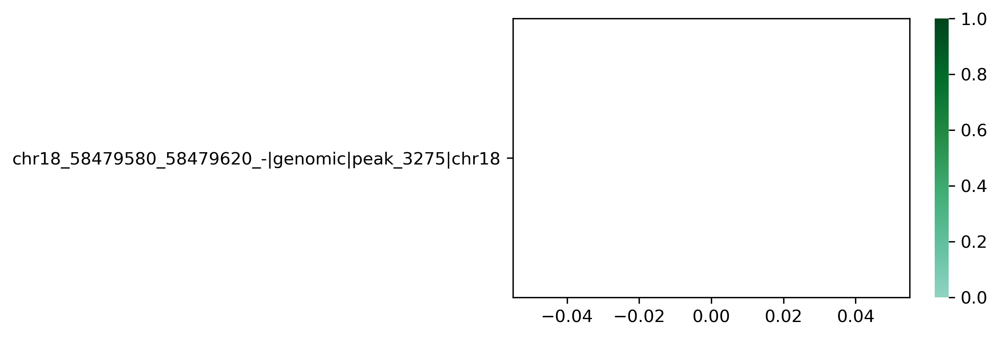

In [517]:
for i in tqdm(DE_methods):
    DE_scatter(DE_method=i)

In [476]:
de_selected_feature={}
for compare_group in compare_group_list: 
    if np.isin( compare_group,compare_list_use):
        de_selected = pd.read_table('output/candidate/'+dataset+
              '/scirep.short.random_forest.up.2019.1.24.23:50/DE_selected_features.'+compare_group+'.txt',index_col=0)
        de_selected_feature[compare_group] = np.array(de_selected.index)
        up_selected = pd.read_table('output/candidate/'+dataset+
              '/scirep.short.random_forest.up.2019.1.24.23:50/'+compare_group+'_feature_table.txt',index_col=0)
        up_selected_feature = np.array(up_selected.index)
        any_selected = pd.read_table('output/candidate/'+dataset+
              '/scirep.short.random_forest.any.2019.1.24.22:55/'+compare_group+'_feature_table.txt',index_col=0)
        any_selected_feature = np.array(any_selected.index)
    

In [477]:
selected_features = {}

for compare_group in compare_group_list: 
    if np.isin( compare_group,compare_list_use):
        selected_features[compare_group] = de_selected_feature[compare_group]
        for k in ['up','any']:
            selected_features[compare_group]=np.concatenate((selected_features[compare_group],selected_feature[compare_group][k]))
all_selected_features=np.concatenate((selected_features['Normal-CRC'],selected_features['Normal-CRC_S1'],
                                     selected_features['Normal-PRAD']))
all_selected_features_df =pd.DataFrame(index=np.unique(all_selected_features),columns=['Normal-CRC','Normal-CRC_S1','Normal-PRAD'])
all_selected_features_df.iloc[:,:]=0
for compare_group in compare_group_list: 
    if np.isin( compare_group,compare_list_use):
        print (compare_group)
        tmpindex,tmpcount = np.unique(selected_features[compare_group],return_counts=True)
        all_selected_features_df[compare_group].iloc[np.isin(all_selected_features_df.index,tmpindex)] =tmpcount 
display((all_selected_features_df.iloc[np.argsort(np.array(-all_selected_features_df.mean(axis=1)))].iloc[:20]/3).style\
        .background_gradient(cmap=sns.light_palette('green', as_cmap=True))\
        .set_precision(2)\
        .set_caption('overlap features'))


Normal-CRC
Normal-PRAD
Normal-CRC_S1


,Normal-CRC,Normal-CRC_S1,Normal-PRAD
chr5_61290640_61290680_+|genomic|peak_4429|chr5,0.33,0.33,0.33
chr14_24413040_24413080_-|genomic|peak_2722|chr14,0.33,0.33,0.33
chr5_66024760_66024800_-|genomic|peak_4433|chr5,0.33,0.33,0.33
chr6_113281000_113281040_-|genomic|peak_4714|chr6,0.33,0.33,0.33
chr18_61798220_61798260_+|genomic|peak_3281|chr18,0.33,0.33,0.33
chr8_48570860_48570900_-|genomic|peak_5026|chr8,0.33,0.33,0.33
AC113554.2|mRNA|peak_1335|ENST00000577647.2,0.33,0.33,0.33
chr22_42453300_42453340_-|genomic|peak_3919|chr22,0.33,0.33,0.33
chrX_137358980_137359020_+|genomic|peak_5426|chrX,0.33,0.33,0.33
chr9_84980980_84981020_-|genomic|peak_5194|chr9,0.33,0.33,0.33


In [479]:
selected_features = {}

for compare_group in compare_group_list: 
    if np.isin( compare_group,compare_list_use):
        selected_features[compare_group] = de_selected_feature[compare_group]
        for k in ['up','any']:
            selected_features[compare_group]=np.concatenate((selected_features[compare_group],selected_feature[compare_group][k]))
            
for compare_group in compare_group_list: 
    if np.isin( compare_group,compare_list_use):
        all_selected_features_df =pd.DataFrame(index=np.unique(selected_features[compare_group]),columns=['any','up','DE'])
        all_selected_features_df.iloc[:,:]=0

        for k in ['up','any']:
            tmpindex,tmpcount = np.unique(selected_feature[compare_group][k],return_counts=True)
            all_selected_features_df[k].iloc[np.isin(all_selected_features_df.index,tmpindex)] =tmpcount 
        all_selected_features_df['DE'].iloc[np.isin(all_selected_features_df.index,de_selected_feature[compare_group])] = np.unique(de_selected_feature[compare_group],return_counts=True)[1]
        display((all_selected_features_df.iloc[np.argsort(np.array(-all_selected_features_df.mean(axis=1)))].iloc[:20]).style\
        .background_gradient(cmap=sns.light_palette('green', as_cmap=True))\
        .set_precision(2)\
        .set_caption('overlap features'+compare_group))
        

,any,up,DE
30984|tRNA|30984|peak_320|30984|20|72,1,1,0
21915|tRNA|21915|peak_126|21915|0|40,0,1,0
chrX_137358980_137359020_+|genomic|peak_5426|chrX,0,0,1
chr9_84980980_84981020_-|genomic|peak_5194|chr9,0,0,1
chr8_48570860_48570900_-|genomic|peak_5026|chr8,0,0,1
chr6_113281000_113281040_-|genomic|peak_4714|chr6,0,0,1
chr5_66024760_66024800_-|genomic|peak_4433|chr5,0,0,1
chr5_61290640_61290680_+|genomic|peak_4429|chr5,0,0,1
chr3_98930080_98930120_+|genomic|chr3_98930080_98930120_+|peak_4065|chr3|98930080|98930120,1,0,0
chr22_42453300_42453340_-|genomic|peak_3919|chr22,0,0,1


,any,up,DE
hsa-miR-130a-3p|miRNA|hsa-miR-130a-3p|hsa-miR-130a-3p|hsa-miR-130a-3p|0|22,1,1,0
chr16_985540_985580_-|genomic|chr16_985540_985580_-|peak_2953|chr16|985540|985580,1,1,0
hsa-miR-410-3p|miRNA|hsa-miR-410-3p|hsa-miR-410-3p|hsa-miR-410-3p|0|21,1,1,0
30984|tRNA|30984|peak_320|30984|20|72,0,1,0
hsa-miR-22-5p|miRNA|hsa-miR-22-5p|hsa-miR-22-5p|hsa-miR-22-5p|0|22,0,1,0
hsa-miR-125b-1-3p|miRNA|hsa-miR-125b-1-3p|hsa-miR-125b-1-3p|hsa-miR-125b-1-3p|0|22,0,1,0
hsa-miR-125a-3p|miRNA|hsa-miR-125a-3p|hsa-miR-125a-3p|hsa-miR-125a-3p|0|22,0,1,0
chrX_137358980_137359020_+|genomic|peak_5426|chrX,0,0,1
chr9_84980980_84981020_-|genomic|peak_5194|chr9,0,0,1
chr8_48570860_48570900_-|genomic|peak_5026|chr8,0,0,1


,any,up,DE
22263|tRNA|22263|peak_130|22263|0|72,1,0,0
chr9_84980980_84981020_-|genomic|peak_5194|chr9,0,0,1
chr8_48570860_48570900_-|genomic|peak_5026|chr8,0,0,1
chr6_113281000_113281040_-|genomic|peak_4714|chr6,0,0,1
chr5_66024760_66024800_-|genomic|peak_4433|chr5,0,0,1
chr5_61290640_61290680_+|genomic|peak_4429|chr5,0,0,1
chr5_37996200_37996240_-|genomic|chr5_37996200_37996240_-|peak_4408|chr5|37996200|37996240,1,0,0
chr4_83237860_83237900_+|genomic|chr4_83237860_83237900_+|peak_4251|chr4|83237860|83237900,1,0,0
chr4_166142580_166142640_+|genomic|chr4_166142580_166142640_+|peak_4337|chr4|166142580|166142640,0,1,0
chr22_42453300_42453340_-|genomic|peak_3919|chr22,0,0,1


In [484]:
np.log2(cpm_table_origin)

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,9.430677,10.270620,9.269412,8.425525,10.403299,9.052455,10.203255,10.163336,10.631497,10.116532,...,10.039675,8.791154,9.165234,10.648002,11.037152,10.128731,9.786441,9.266240,10.736547,10.280964
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,12.550462,13.988167,12.591340,11.914651,13.505179,12.465031,13.592885,13.695768,13.928250,14.324224,...,14.051924,12.085527,12.652500,13.849407,14.203433,13.177350,12.920187,12.286946,13.909689,13.575991
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,9.131509,9.705596,8.727618,8.942924,9.279802,8.616870,9.000626,9.142726,9.655380,10.238059,...,9.499285,8.702716,9.476820,9.494829,9.847704,9.543768,9.411402,9.116416,10.024633,9.095749
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,17.073743,17.068159,17.172224,16.932724,16.131521,16.306810,16.411991,16.865865,16.970401,16.867893,...,16.484788,16.461208,16.753514,16.424491,17.246209,16.595021,16.390738,16.927872,17.254547,17.131032
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,6.144000,7.024126,6.527945,5.490065,6.444296,5.271095,6.082239,6.309187,7.375887,7.305746,...,6.329360,5.960213,5.264770,6.842752,7.737459,6.049004,6.581327,5.821455,7.231815,5.905925
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,12.979506,13.791061,13.039698,12.371485,13.089147,12.486223,13.330546,13.522634,13.736495,13.821709,...,13.547491,12.486185,12.913427,13.575387,13.921459,12.918247,12.912244,12.803392,14.263691,14.389405
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,12.403662,13.197827,12.198602,11.461609,12.638883,11.742770,12.342265,12.429458,13.197360,13.800802,...,12.739660,11.929544,12.332294,12.752584,13.191093,12.536478,12.294045,12.458348,13.468374,12.256127
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,11.171716,11.962429,11.051507,10.328008,11.665800,11.001282,11.790427,11.940411,11.952987,12.400264,...,12.224178,11.017996,11.319329,12.030558,12.323835,11.744390,11.382945,10.958351,12.186011,11.938430
hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22,7.514838,8.697085,7.717770,6.782847,8.029259,7.078450,8.067740,8.163336,8.515290,8.598528,...,8.276893,7.735506,8.112767,8.397967,8.594854,8.113134,8.026112,7.621156,8.773964,7.950319
hsa-let-7e-5p|miRNA|hsa-let-7e-5p|hsa-let-7e-5p|hsa-let-7e-5p|0|22,10.603432,11.472379,10.332076,9.741784,10.800634,10.124924,11.000626,11.050309,11.548133,12.094954,...,11.400056,9.848488,10.349401,11.143921,11.527740,10.739319,10.405755,10.146052,11.745438,11.047180


# Matrix processing

In [16]:
def null_name(string):
    if string =='null':
        return '.null'
    else:
        return '.'+string
    
def generate_processed_filename(original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index): 
    imputename = null_name(imputation_method)
    normname = null_name(normalization_method)
    batchname = null_name(batch_removal_method)
    if batch_index=='null':
        batchindname = ''
    else:
        batchindname = '_'+batch_index
    return'filter'+imputename+normname+batchname+batchindname+'.'+original_mx_file.split('/')[-1]

In [14]:
def summarize_feature_selection(output_dir):
    metrics = []
    features = []
    pbar = tqdm(unit='directory')
    dirstack = []
    for count_method in os.listdir(os.path.join(output_dir, 'select_preprocess_method', 'uca_score')):
        preprocess_method = open(os.path.join(output_dir, 'select_preprocess_method', 'uca_score', count_method, 'selected_methods.txt')).readline().strip()
        dirstack.append(os.path.join(output_dir, 'cross_validation', preprocess_method + '.' + count_method))
        for compare_group in os.listdir(dirstack[-1]):
            dirstack.append(os.path.join(dirstack[-1], compare_group))
            for feature_selection_method in os.listdir(dirstack[-1]):
                classifier, n_select, select_method, fold_change_direction  = feature_selection_method.split('.')
                metadata = {
                    'compare_group': compare_group,
                    'classifier': classifier,
                    'n_features': n_select,
                    'fold_change_direction': fold_change_direction,
                    'preprocess_method': preprocess_method,
                    'count_method': count_method
                }
                try:
                    df = pd.read_table(os.path.join(dirstack[-1], feature_selection_method, 'metrics.test.txt'), sep='\t')
                except IOError:
                    continue
                df_metadata = pd.DataFrame(index=np.arange(df.shape[0]))
                for key, val in metadata.items():
                    df_metadata[key] = val
                metrics.append(pd.concat([df_metadata, df], axis=1))
                pbar.update(1)
            dirstack.pop()
        dirstack.pop()
    metrics = pd.concat(metrics, axis=0)
    return metrics

metrics = summarize_feature_selection('output/'+dataset)

#newdf = df[(df['fold_change_direction']==value_change)&(df['classifier']==classifier_use)]
#metrics=pd.read_table('output/scirep/summary/cross_validation/metrics.train.txt')
newdf=metrics
newdf.index = newdf.compare_group
newdf['preprocess_methods'] = np.array([newdf.preprocess_method[i]+'.'+newdf.count_method[i] for i in range(newdf.shape[0])])
compare_list_use = np.array(['Normal-CRC','Normal-CRC_S1','Normal-PAAD',
                             'Normal-PRAD','Normal-HCC'])
tmpdict = {}
for i in np.unique(newdf.index):
    
    if np.isin(i,compare_list_use):
        print(i)
        tmpdict[i] = np.unique(newdf.loc[i].preprocess_methods)

best_preprocess_methods = tmpdict[example_cancer][np.where(
    np.array([tmpdict[example_cancer][i].split('.')[-1] for i in range(tmpdict[example_cancer].shape[0])])==exp_mx_name)]

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

Normal-CRC
Normal-CRC_S1
Normal-PAAD
Normal-PRAD


In [17]:
matrix_processing_path = 'output/'+dataset+'/matrix_processing/'
selected_best_method_best = best_preprocess_methods[0]#.split(' ')[0]
imputation_method = selected_best_method_best.split('.')[1]
normalization_method = selected_best_method_best.split('.')[2]
batch_removal_method = selected_best_method_best.split('.')[3]
batch_index = 'null'
if dataset=='scirep':
    if stage_info =='No Stage':
        class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
    else:
        class_info = 'data/'+dataset+'/sample_classes.txt'
batch_info = 'data/'+dataset+'/batch_info.txt'
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'

original_mx = pd.read_table(original_mx_file,index_col=0)
processed_mx = pd.read_table(matrix_processing_path+generate_processed_filename(\
            original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index),index_col=0)
sample_class = pd.read_table(class_info,sep='\t',index_col=0)
batchtable = pd.read_table(batch_info,sep='\t',index_col=0)


## abundance and diversity

In [140]:
def div_abu_plot(expression_mx,savefig=True):
    #### Diversity matrix
    type_counts_sample = pd.DataFrame()
    for samplename in expression_mx.columns.values:
        #names_[samplename] = expression_mx[samplename].index

        filter_zero_samplename = expression_mx.iloc[np.where(expression_mx[samplename]>0)[0],:]
        names = filter_zero_samplename.index
        names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
        type_counts = np.unique(names_type, return_counts = True)
        new = pd.DataFrame({'type' : type_counts[0],
                            samplename : type_counts[1],
                           })
        new = new.set_index('type')
        type_counts_sample = pd.concat([type_counts_sample, new], axis=1)#, join_axes=[df1.index]
    
    #expression_mx = original_mx
    typelist = np.unique([expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])])
    type_mx = pd.DataFrame(index=typelist,columns=expression_mx.columns)
    for sample in expression_mx.columns:
        sample_feature = pd.DataFrame(data=expression_mx.loc[:,sample],index=expression_mx.index)
        sample_feature['type']=[expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])]
        for i in typelist:
            #print(i,sample,sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum())
            type_mx.loc[i,sample] = sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum()
    table_ratio = (type_mx/type_mx.sum()).T
    ####mean_sd matrix
    xticks = type_counts_sample.index.tolist()
    Means = type_counts_sample.mean(axis=1).values.tolist()
    Std=type_counts_sample.std(axis=1).values.tolist()
    mean_sd = pd.DataFrame(data = {'type':xticks,'mean':Means,'std':Std})
    mean_sd = mean_sd.sort_values(by='mean',ascending=False)
    mean_sd = mean_sd.set_index('type')
    Std = [[0]*len(mean_sd['std'].tolist()),mean_sd['std'].tolist()]
    ab = table_ratio*100
    #ab['genomic'] = ab['intron'] + ab['promoter'] + ab['enhancer'] + ab['repeats'] + ab['circRNA'] +ab['other']
    xticks_ab = ab.columns.tolist()
    Means_ab = ab.mean(axis=0).values.tolist()
    Std_ab = ab.std(axis=0).values.tolist()
    mean_sd_ab = pd.DataFrame(data = {'type':xticks_ab,'mean_ab':Means_ab,'std_ab':Std_ab})
    mean_sd_ab = mean_sd_ab.set_index('type')
    N = type_counts_sample.shape[0]
    ind = np.arange(N)
    merge = pd.concat([mean_sd,mean_sd_ab],axis=1,join_axes=[mean_sd.index])
    Std_ab = [[0]*len(merge['std_ab'].tolist()),merge['std_ab'].tolist()]
    xticks = merge.index.tolist()
    ####plot
    plt.rcParams['figure.dpi'] = 300    
    fig,(ax,ax1) = plt.subplots(1,2,figsize = (7,3.5))
    ax.barh(ind,merge['mean'],0.7,xerr=Std,color='grey')
    ax.invert_xaxis()
    ax = std_plot(ax,'Number of detected genes','','Diversity',left=False,ylim=[-0.5,10.5])#,ylim=[np.min(ind),np.max(ind)]
    ax.set_yticks(ind)
    #ax.set_yticks([])
    ax1.barh(ind,merge['mean_ab'],0.7,xerr=Std_ab,color="grey",)
    ax1.set_yticks(ind)
    ax1.set_yticklabels(xticks)
    ax1 = std_plot(ax1,'Percentage of mapped reads (%)','','Abundance',ylim=[-0.5,10.5])
    if savefig is True:
        fig.savefig('diversity_abundance'+saveformat)
    embed_pdf_figure()    

div_abu_plot(expression_mx=original_mx,savefig=True)

## filtering effect

In [141]:
def plot_bar_for_filter(expression_mx,cutoff_ratio = 0.2,counts_threshold = 10 ):
    retain_index = np.where(np.sum(expression_mx > counts_threshold,axis=1) >=round(cutoff_ratio*expression_mx.shape[1]))[0]
    filter_mx = expression_mx.iloc[retain_index,:]
    names = expression_mx.index
    names_ = filter_mx.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    names_type_ = np.array([names_[i].split('|')[1] for i in range(names_.shape[0])])
    type_counts_ = np.unique(names_type_, return_counts = True)
    typedataframe = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1))
    typedataframe.columns = ['type','counts']
    typedataframe_ = pd.DataFrame(np.concatenate((type_counts_[0].reshape(-1,1),type_counts_[1].reshape(-1,1)),axis=1))
    typedataframe_.columns = ['type','counts']
    typedataframe.counts = pd.to_numeric(typedataframe.counts)
    typedataframe_.counts = pd.to_numeric(typedataframe_.counts)
    dataall = pd.concat((typedataframe,typedataframe_))
    operation = np.concatenate((np.repeat('original',typedataframe.shape[0]),
                                           np.repeat('filter',typedataframe.shape[0])))

    dataall['operation'] = operation
    fig,ax=plt.subplots(1,figsize=(7, 3))
    sns.barplot(ax=ax,data=dataall,x='type',y='counts',hue='operation')
    #ax.set_title('samples with expression value higher than '+str(counts_threshold) +
    #                ' are more than '+str(round(cutoff_ratio*100))+'%',fontsize=26)
    std_plot(ax,'type','counts',
             'samples with expression value higher than '+str(counts_threshold) +
             ' are more than '+str(round(cutoff_ratio*100))+'%',legendtitle='operation',legendsort=False,borderpad=1,handletextpad=1)
    print (expression_mx.shape[0],' original feature')
    print (retain_index.shape[0],' feature remained')
plot_bar_for_filter(original_mx,cutoff_ratio = 0.1 ,counts_threshold = 10 )
embed_pdf_figure()

7869  original feature
5945  feature remained


In [145]:
def plot_bar_for_filter_cpm(expression_mx,cutoff_ratio = 0.2,counts_threshold = 10):
    exshape = expression_mx.shape[0]
    cpm_mat = expression_mx/expression_mx.sum(axis=0)*10e6
    length_tmp = np.array([cpm_mat.index[i].split('|')[-1] for i in range(cpm_mat.index.shape[0])]).astype('int')-\
    np.array([cpm_mat.index[i].split('|')[-2] for i in range(cpm_mat.index.shape[0])]).astype('int')
    rpkm_mat = (cpm_mat.T/length_tmp*1000).T
    if sequencing_type=='short': #cpm
        expression_mx = cpm_mat
        matname = 'CPM'
    if sequencing_type=='long': #rpm
        expression_mx = rpkm_mat 
        matname = 'RPKM'
    retain_index = np.where(np.sum(expression_mx > counts_threshold,axis=1) >=round(cutoff_ratio*expression_mx.shape[1]))[0]
    filter_mx = expression_mx.iloc[retain_index,:]
    names = expression_mx.index
    names_ = filter_mx.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    names_type_ = np.array([names_[i].split('|')[1] for i in range(names_.shape[0])])
    type_counts_ = np.unique(names_type_, return_counts = True)
    typedataframe = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1))
    typedataframe.columns = ['type','counts']
    typedataframe_ = pd.DataFrame(np.concatenate((type_counts_[0].reshape(-1,1),type_counts_[1].reshape(-1,1)),axis=1))
    typedataframe_.columns = ['type','counts']
    typedataframe.counts = pd.to_numeric(typedataframe.counts)
    typedataframe_.counts = pd.to_numeric(typedataframe_.counts)
    dataall = pd.concat((typedataframe,typedataframe_))
    operation = np.concatenate((np.repeat('original',typedataframe.shape[0]),
                                           np.repeat('filter',typedataframe.shape[0])))
    dataall['operation'] = operation
    fig,ax=plt.subplots(1,figsize=(7 , 3))
    sns.barplot(ax=ax,data=dataall,x='type',y='counts',hue='operation')
    #ax.set_title('Samples with '+matname+' expression value higher than '+str(counts_threshold) +
    #                ' are more than '+str(round(cutoff_ratio*100))+'%',fontsize=26)
    std_plot(ax,'type','counts',
             'Samples with '+matname+' expression value higher than '+str(counts_threshold) +
             ' are more than '+str(round(cutoff_ratio*100))+'%',
             legendtitle='operation',legendsort=False,borderpad=1,handletextpad=1)
    fig.tight_layout()
    print (exshape,' original feature')
    print (retain_index.shape[0],' feature remained')
plot_bar_for_filter_cpm(original_mx,cutoff_ratio = 0.1 ,counts_threshold = 10 )

embed_pdf_figure()


7869  original feature
6056  feature remained


## relative log expression

TO DO

## expression vs read depth

TO DO

## define clustering score

In [19]:
def alignment_score(X, y, K=10):
    N = X.shape[0]
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    score = 1.0 - (np.mean(same_class_fractions) - K/N)/(K - K/N)
    print (same_class_fractions.shape,np.mean(same_class_fractions),K/N,neighbor_classes)
    return score
def knn_score(X, y, K=10):
    N = X.shape[0]
    assert K < N
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    classes, counts = np.unique(y, return_counts=True)
    classes = np.argmax(y.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    counts = np.take(counts, classes)
    mean_r = K/(N - 1)*counts
    max_r = np.minimum(K, counts)
    #print (same_class_fractions.shape,mean_r.shape,max_r.shape)
    #scores = (np.mean(same_class_fractions) - mean_r)/(max_r - mean_r)
    scores = (same_class_fractions - mean_r)/(max_r - mean_r)
    #print(scores)
    return scores.mean()
def convert_label_to_int(sample_class):
    classes, counts = np.unique(sample_class, return_counts=True)
    classes = np.argmax(sample_class.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    return classes
def unsupervised_clustering_accuracy(y, y_pred):
    """
    Unsupervised Clustering Accuracy
    """
    from sklearn.utils.linear_assignment_ import linear_assignment
    assert len(y_pred) == len(y)
    u = np.unique(np.concatenate((y, y_pred)))
    n_clusters = len(u)
    mapping = dict(zip(u, range(n_clusters)))
    reward_matrix = np.zeros((n_clusters, n_clusters), dtype=np.int64)
    for y_pred_, y_ in zip(y_pred, y):
        if y_ in mapping:
            reward_matrix[mapping[y_pred_], mapping[y_]] += 1
    cost_matrix = reward_matrix.max() - reward_matrix
    ind = linear_assignment(cost_matrix)
    return sum([reward_matrix[i, j] for i, j in ind]) * 1.0 / y_pred.size, ind
def clustering_scores(X,y, prediction_algorithm='knn'):
    from sklearn.metrics import adjusted_rand_score as ARI
    from sklearn.metrics import normalized_mutual_info_score as NMI
    from sklearn.metrics import silhouette_score
    from sklearn.mixture import GaussianMixture as GMM
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    asw_score = silhouette_score(X, labels)
    nmi_score = NMI(labels, labels_pred)
    ari_score = ARI(labels, labels_pred)
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return asw_score, nmi_score, ari_score, uca_score

def uca_scores(X,y, prediction_algorithm='knn'):
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return uca_score

def get_clustering_score(data,sampleclass,method = 'PCA',prediction_algorithm='knn'):
    X = log_transfrom(data).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    #X_pca = transform.fit_transform(X)
    X_, y_ = X, sampleclass.loc[data.columns.values].values.ravel() 
    #knn_score_ = knn_score(X_, y_)
    #asw_score, nmi_score, ari_score, uca_score = clustering_scores(X_, y_, prediction_algorithm)
    uca_score = uca_scores(X_, y_, prediction_algorithm)
    return uca_score

## plot UCA score of different methods

In [147]:
uca_summary = pd.read_table('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/summary.txt',
                           index_col=0)
                            

In [148]:
uca_summary_table = pd.DataFrame(np.ndarray([uca_summary.shape[0],4]))
uca_summary_table.columns = ['imputation','normalization','batch_removal','uca_score']
for i in range(uca_summary.shape[0]):
    splittmp = uca_summary.index[i].split('.')
    uca_summary_table.iloc[i,0] = splittmp[1]
    uca_summary_table.iloc[i,1] = splittmp[2]
    uca_summary_table.iloc[i,2] = splittmp[3]
    uca_summary_table.iloc[i,3] = uca_summary.values[i]

In [149]:
display_dataframe(uca_summary_table.groupby(uca_summary_table.columns[0]).mean(),filename='Imputation Methods UCA Score',gradientfunc=False)
display_dataframe(uca_summary_table.groupby(uca_summary_table.columns[1]).mean(),filename='Normalization Methods UCA Score',gradientfunc=False)
display_dataframe(uca_summary_table.groupby(uca_summary_table.columns[2]).mean(),filename='Batch Removal Methods UCA Score',gradientfunc=False)
uca_mean_summary = pd.concat((uca_summary_table.groupby(uca_summary_table.columns[0]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[1]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[2]).mean()))
uca_mean_summary =  uca_mean_summary.rename(index={'null': 'imputation_null'})

,uca_score
imputation,
null,0.272917


,uca_score
normalization,
Norm_CPM,0.288542
Norm_CPM_top,0.280208
Norm_RLE,0.265625
Norm_SCnorm,0.26875
Norm_TMM,0.261458


,uca_score
batch_removal,
Batch_Combat_1,0.289583
Batch_Combat_2,0.279167
Batch_Combat_3,0.251042
Batch_RUV,0.285417
Batch_null,0.259375


In [150]:
fig, ax = plt.subplots(1,figsize=(7, 4))
uca_mean_summary.plot(kind='bar',ax=ax,width=0.8,
                legend=True)
std_plot(ax,'','')
legend = ax.legend(prop=fontlegend,
              bbox_to_anchor=[0.2,1],
              borderpad=1,
              edgecolor="#000000",fancybox=False)
ax.legend_.get_frame()._linewidth=0.5
legend.get_title().set_fontweight('normal')
legend.get_title().set_fontsize(6.5)
fig.tight_layout()

embed_pdf_figure()

## PCA, tSNE and UMAP plot

In [8]:
def PCA_plot_with_uca_score_sns(ax,data,sampleclass,method = 'PCA'):
    X = log_transfrom(data).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    classnum = np.unique(plot_table.iloc[:,2]).shape[0]
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                    palette=np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum],hue="class",style='class',s=30)
    #plt.figure(linewidth=30.5)
    #ax.spines['right'].set_visible(False)
    #ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    #ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #ax.annotate('UCA score: {:.6f}'.format(uca_score),xy=(1,0),xycoords='data',size=6.5)
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [201]:
def PCA_plot_with_uca_score_sns(ax,data,sampleclass,method = 'PCA'):
    X = log_transfrom(data).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    import struct

    # RGB元素范围(0-1)
    def hex_to_rgb(hex_str):
        hex_str = hex_str[1:]
        int_tuple = struct.unpack('BBB', bytes.fromhex(hex_str))    
        return tuple([val/255 for val in int_tuple])  
    X = log_transfrom(data).T
    X = StandardScaler().fit_transform(X)
    transform = PCA()
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    tmp = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table = pd.concat((tmp,pd.DataFrame(batchtable.iloc[:,0]).loc[plot_table.index]),axis=1)
    batchname = plot_table.columns[3]
    plot_table.columns = ['dimension_1','dimension_2','class','batch']
    classnum = np.unique(plot_table.iloc[:,2]).shape[0]
    colormap = pd.DataFrame(np.array([np.unique(plot_table['class']).tolist(),\
                           np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum].tolist()])).T
    colormap.columns = ['class','HEX']
    colormap['RGB']=[hex_to_rgb(i) for i in colormap['HEX']]
    plot_table = pd.merge(plot_table, colormap, on=['class'])
    batch_alpha = [(i+1)/len(np.unique(plot_table['batch'])) for i in range(len(np.unique(plot_table['batch'])))]

    alphamap = pd.DataFrame(np.array([np.unique(plot_table['batch']),
                          batch_alpha])).T
    alphamap.columns = ['batch','alpha']
    plot_table = pd.merge(plot_table, alphamap, on=['batch'])
    plot_table['RGBA']=None
    nrows = plot_table.shape[0]
    plot_table['RGBA'] = [plot_table.loc[i,'RGB']+tuple([plot_table.loc[i,'alpha']]) for i in range(nrows)]
    ax.scatter(plot_table['dimension_1'],plot_table['dimension_2'],color=plot_table['RGBA'],s=100)
    uca_score = get_clustering_score(data, sampleclass)
    return uca_score

In [28]:
data = original_mx
sampleclass = sample_class
X = log_transfrom(data).T
X = StandardScaler().fit_transform(X)

In [197]:
data = array([[ 1.  ,  1.  ],
       [ 0.9 ,  0.95],
       [ 1.01,  1.03],
       [ 2.  ,  2.  ],
       [ 2.03,  2.06],
       [ 1.98,  1.89],
       [ 3.  ,  3.  ],
       [ 3.03,  3.05],
       [ 2.89,  3.1 ],
       [ 4.  ,  4.  ],
       [ 4.06,  4.02],
       [ 3.97,  4.01]])
transform = PCA()
X_pca = transform.fit_transform(data)
X_pca

array([[ 2.12015916e+00, -1.12482383e-02],
       [ 2.22617682e+00,  2.42518425e-02],
       [ 2.09185561e+00,  2.85527757e-03],
       [ 7.05946916e-01, -1.31785668e-02],
       [ 6.42278410e-01,  7.94775208e-03],
       [ 7.97957576e-01, -7.66926465e-02],
       [-7.08265329e-01, -1.51088953e-02],
       [-7.64853122e-01, -1.04398600e-03],
       [-7.01396953e-01,  1.33393042e-01],
       [-2.12247757e+00, -1.70392238e-02],
       [-2.17900746e+00, -4.54006818e-02],
       [-2.10837406e+00,  1.12643244e-02]])

In [41]:
transform = PCA()
X_pca = transform.fit_transform(X)
plot_table = pd.DataFrame(X_pca[:,:2])
plot_table.index = data.columns

In [52]:
X_pca.shape

(192, 192)

In [64]:
sampleclass

,label
sample_id,
Sample_1S3,Colorectal Cancer
Sample_1S6,Colorectal Cancer
Sample_1S9,Colorectal Cancer
Sample_1S12,Colorectal Cancer
Sample_1S15,Colorectal Cancer
Sample_1S18,Colorectal Cancer
Sample_1S21,Colorectal Cancer
Sample_1S24,Colorectal Cancer
Sample_4S2,Colorectal Cancer


In [66]:
pd.DataFrame(batchtable.iloc[:,0]).loc[plot_table.index]

,RNA Isolation batch
Sample_1S3,2
Sample_1S6,6
Sample_1S9,1
Sample_1S12,3
Sample_1S15,4
Sample_1S18,5
Sample_1S21,7
Sample_1S24,8
Sample_4S2,2
Sample_4S5,6


In [68]:
tmp = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
plot_table = pd.concat((tmp,pd.DataFrame(batchtable.iloc[:,0]).loc[plot_table.index]),axis=1)
plot_table

,0,1,label,RNA Isolation batch
Sample_1S3,-24.791810,-29.763038,Colorectal Cancer,2
Sample_1S6,-19.426246,0.378587,Colorectal Cancer,6
Sample_1S9,-19.681109,-18.121198,Colorectal Cancer,1
Sample_1S12,104.535450,-31.913951,Colorectal Cancer,3
Sample_1S15,-18.220285,42.782558,Colorectal Cancer,4
Sample_1S18,-26.696599,4.887728,Colorectal Cancer,5
Sample_1S21,-13.629040,32.536180,Colorectal Cancer,7
Sample_1S24,131.458751,36.872204,Colorectal Cancer,8
Sample_4S2,-16.364223,-1.821493,Colorectal Cancer,2
Sample_4S5,-24.981266,-7.600678,Colorectal Cancer,6


In [69]:
batchname = plot_table.columns[3]
plot_table.columns = ['dimension_1','dimension_2','class','batch']

In [70]:
classnum = np.unique(plot_table.iloc[:,2]).shape[0]
classnum

4

In [131]:
np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum].tolist()

['#3182bd', '#fd8d3c', '#a1d99b', '#dadaeb']

In [142]:
colormap = pd.DataFrame(np.array([np.unique(plot_table['class']).tolist(),\
                       np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum].tolist()])).T
colormap.columns = ['class','HEX']
colormap['RGB']=[hex_to_rgb(i) for i in colormap['HEX']]
colormap

,class,HEX,RGB
0,Colorectal Cancer,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74..."
1,Healthy Control,#fd8d3c,"(0.9921568627450981, 0.5529411764705883, 0.235..."
2,Pancreatic Cancer,#a1d99b,"(0.6313725490196078, 0.8509803921568627, 0.607..."
3,Prostate Cancer,#dadaeb,"(0.8549019607843137, 0.8549019607843137, 0.921..."


In [141]:
plot_table

,dimension_1,dimension_2,class,batch
Sample_1S3,-24.791810,-29.763038,Colorectal Cancer,2
Sample_1S6,-19.426246,0.378587,Colorectal Cancer,6
Sample_1S9,-19.681109,-18.121198,Colorectal Cancer,1
Sample_1S12,104.535450,-31.913951,Colorectal Cancer,3
Sample_1S15,-18.220285,42.782558,Colorectal Cancer,4
Sample_1S18,-26.696599,4.887728,Colorectal Cancer,5
Sample_1S21,-13.629040,32.536180,Colorectal Cancer,7
Sample_1S24,131.458751,36.872204,Colorectal Cancer,8
Sample_4S2,-16.364223,-1.821493,Colorectal Cancer,2
Sample_4S5,-24.981266,-7.600678,Colorectal Cancer,6


In [156]:
plot_table = pd.merge(plot_table, colormap, on=['class'])


In [155]:
batch_alpha = [(i+1)/len(np.unique(plot_table['batch'])) for i in range(len(np.unique(plot_table['batch'])))]

alphamap = pd.DataFrame(np.array([np.unique(plot_table['batch']),
                      batch_alpha])).T
alphamap.columns = ['batch','alpha']
alphamap

,batch,alpha
0,1.0,0.111111
1,2.0,0.222222
2,3.0,0.333333
3,4.0,0.444444
4,5.0,0.555556
5,6.0,0.666667
6,7.0,0.777778
7,8.0,0.888889
8,9.0,1.000000


In [157]:
plot_table = pd.merge(plot_table, alphamap, on=['batch'])
plot_table

,dimension_1,dimension_2,class,batch,HEX,RGB,alpha
0,-24.791810,-29.763038,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
1,-16.364223,-1.821493,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
2,-17.543474,-3.310338,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
3,-24.729206,-46.886549,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
4,-25.502570,-35.605768,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
5,-28.523205,-52.450776,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
6,-26.592460,-49.119048,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
7,-25.598079,-57.982455,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
8,-18.292505,-26.004886,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222
9,-25.036641,-36.395853,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222


In [165]:
(0.19215686274509805, 0.5098039215686274)+tuple([0.222222])

(0.19215686274509805, 0.5098039215686274, 0.222222)

In [173]:
plot_table['RGBA']=None

In [177]:
plot_table.loc[i,'RGB']+tuple([plot_table.loc[i,'alpha']])

(0.19215686274509805,
 0.5098039215686274,
 0.7411764705882353,
 0.2222222222222222)

In [188]:
for i in range(nrows):
    print(plot_table.loc[i,'RGB']+tuple([plot_table.loc[i,'alpha']]))

(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.19215686274509805, 0.5098039215686274, 0.7411764705882353, 0.2222222222222222)
(0.9921568627450

In [190]:
nrows = plot_table.shape[0]
plot_table['RGBA'] = [plot_table.loc[i,'RGB']+tuple([plot_table.loc[i,'alpha']]) for i in range(nrows)]
plot_table

,dimension_1,dimension_2,class,batch,HEX,RGB,alpha,RGBA
0,-24.791810,-29.763038,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
1,-16.364223,-1.821493,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
2,-17.543474,-3.310338,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
3,-24.729206,-46.886549,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
4,-25.502570,-35.605768,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
5,-28.523205,-52.450776,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
6,-26.592460,-49.119048,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
7,-25.598079,-57.982455,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
8,-18.292505,-26.004886,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."
9,-25.036641,-36.395853,Colorectal Cancer,2,#3182bd,"(0.19215686274509805, 0.5098039215686274, 0.74...",0.222222,"(0.19215686274509805, 0.5098039215686274, 0.74..."


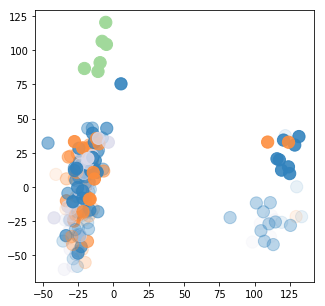

In [196]:
fig,ax =plt.subplots(figsize=(5,5))
ax.scatter(plot_table['dimension_1'],plot_table['dimension_2'],color=plot_table['RGBA'],s=150)

In [92]:
plot_table['color']=[for i in np.unique(plot_table['label'])]

['#3182bd',
 '#6baed6',
 '#9ecae1',
 '#c6dbef',
 '#e6550d',
 '#fd8d3c',
 '#fdae6b',
 '#fdd0a2',
 '#31a354',
 '#74c476',
 '#a1d99b',
 '#c7e9c0',
 '#756bb1',
 '#9e9ac8',
 '#bcbddc',
 '#dadaeb',
 '#636363',
 '#969696',
 '#bdbdbd',
 '#d9d9d9']

In [80]:
np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum]

array(['#3182bd', '#fd8d3c', '#a1d99b', '#dadaeb'], dtype='<U7')

In [99]:
np.array(Category20c[20]).reshape(4,-1).T

array([['#3182bd', '#fd8d3c', '#a1d99b', '#dadaeb'],
       ['#6baed6', '#fdae6b', '#c7e9c0', '#636363'],
       ['#9ecae1', '#fdd0a2', '#756bb1', '#969696'],
       ['#c6dbef', '#31a354', '#9e9ac8', '#bdbdbd'],
       ['#e6550d', '#74c476', '#bcbddc', '#d9d9d9']], dtype='<U7')

In [107]:
'#%02x%02x%02x' % (0, 128, 64)

'#008040'

In [123]:
import struct
 
# RGB元素范围(0-1)
def hex_to_rgb(hex_str):
    hex_str = hex_str[1:]
    int_tuple = struct.unpack('BBB', bytes.fromhex(hex_str))    
    return tuple([val/255 for val in int_tuple])  

In [124]:
hex_to_rgb('#7BF5BE')

(0.4823529411764706, 0.9607843137254902, 0.7450980392156863)

In [108]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import numpy as np

# define some random data that emulates your indeded code:
NCURVES = 10
np.random.seed(101)
curves = [np.random.random(20) for i in range(NCURVES)]
values = range(NCURVES)

In [111]:
jet = cm = plt.get_cmap('jet') 
cNorm  = colors.Normalize(vmin=0, vmax=values[-1])
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)

In [112]:
scalarMap.to_rgba(values[1])

(0.0, 0.0, 0.999108734402852, 1.0)

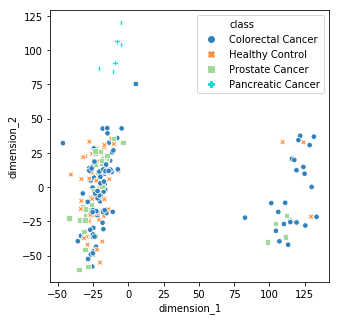

In [87]:
fig, ax = plt.subplots(figsize=(5,5))
sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                    palette=array(['#3182bd', '#fd8d3c', '#a1d99b', '#19dadaeb'], dtype='<U7'),hue="class",style='class',s=30)

In [35]:
X_pca.shape

(192, 192)

In [9]:
def visualize_effect(original_mx,processed_mx,sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(10,5))
    ucascore = PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    std_plot(ax[0],title='Original matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucascore = PCA_plot_with_uca_score_sns(ax[1],processed_mx,sample_class,method)
    std_plot(ax[1],title='Processed matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)

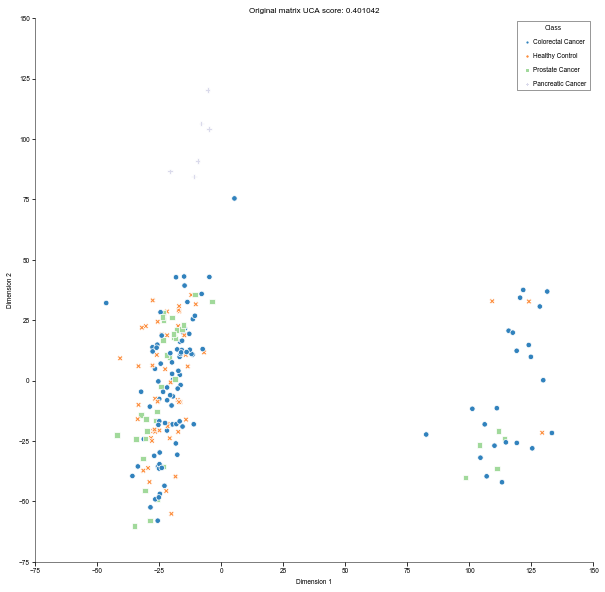

In [26]:
fig, ax = plt.subplots(figsize=(10,10))
ucascore = PCA_plot_with_uca_score_sns(ax,original_mx,sample_class,method='PCA')
std_plot(ax,title='Original matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)

In [202]:
visualize_effect(original_mx,processed_mx,sample_class,method='UMAP')
embed_pdf_figure()

In [203]:
impute_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+imputation_method +'.'+exp_mx_name+'.txt')
normalize_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+imputation_method +'.'+normalization_method+'.'+exp_mx_name+'.txt',index_col=0)
batch_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+imputation_method+'.'+normalization_method+'.'+batch_removal_method+'.'+exp_mx_name+'.txt',index_col=0)


In [204]:
def visualize_effect_all(original_mx,impute_mx, normalize_mx, batch_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(2,2,figsize=(10,10))
    ucalist = pd.DataFrame(index=['Original matrix','Imputed matrix','Normalized matrix','Batch-removed matrix'])
    ucalist[0]=None
    #uca_rna_mx[rnatype]['Original matrix']
    ucalist[0][0] = PCA_plot_with_uca_score_sns(ax[0,0],original_mx,sample_class,method)
    std_plot(ax[0,0],title='Original matrix '+'UCA score: {:.6f}'.format(ucalist[0][0]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucalist[0][1] = PCA_plot_with_uca_score_sns(ax[0,1],impute_mx,sample_class,method)
    std_plot(ax[0,1],title='Imputed matrix '+'UCA score: {:.6f}'.format(ucalist[0][1]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucalist[0][2] = PCA_plot_with_uca_score_sns(ax[1,0],normalize_mx,sample_class,method)
    std_plot(ax[1,0],title='Normalized matrix '+'UCA score: {:.6f}'.format(ucalist[0][2]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucalist[0][3] = PCA_plot_with_uca_score_sns(ax[1,1],batch_mx,sample_class,method)
    std_plot(ax[1,1],title='Batch-removed matrix '+'UCA score: {:.6f}'.format(ucalist[0][3]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    return fig,ucalist

def visualize_effect_final(original_mx,final_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(10,5))
    ucascore = PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    std_plot(ax[0],title='Original matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucascore = PCA_plot_with_uca_score_sns(ax[1],final_mx,sample_class,method)
    std_plot(ax[1],title='Processed matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)

In [205]:
visualize_effect_final(original_mx,processed_mx, sample_class,method='UMAP')
embed_pdf_figure()

In [206]:
visualize_effect_all(original_mx, impute_table, normalize_table, batch_table, sample_class,method='UMAP')
embed_pdf_figure(title='UCA score of matrices through four procedures')


## top K feature

In [161]:
def plot_top20(expression_mx):
    em = expression_mx
    em_ratio = em/em.sum(axis=0)
    em_sum = em.sum(axis=1)
    featurename = pd.DataFrame(em_sum.sort_values(ascending=False)).iloc[:20].index.values.tolist()
    em_top = em_ratio.iloc[np.where(em.index.isin(featurename))[0],:]
    em_top = em_top.reset_index()
    em_top['feature'] = em_top['feature'].astype('category')
    em_top['feature'].cat.reorder_categories(featurename,inplace=True)
    em_top.sort_values('feature',inplace=True)
    em_top = em_top.set_index(['feature'])
    em_top.columns.name = 'samplename'
    stack = pd.DataFrame(em_top.stack())
    stack = stack.reset_index()

    #stack['class'] = stack['samplename']
    #for samplename in unique(stack['samplename']):
    #    stack['class'].iloc[np.where(stack['samplename'] == samplename)] \
    #    = sample_class[sample_class.index==samplename]['label'].values[0]

    stack.rename(columns={ stack.columns[2]: "counts" }, inplace=True)
    stack['feature_cut'] = np.array([stack['feature'][i].split('|')[0] for i in range(stack.shape[0])])
    # attention sns merge function

    fig,ax=plt.subplots(figsize=(7,5))
    ax = sns.stripplot(x="counts", y="feature_cut", data=stack,jitter=True, linewidth=0.1,size=1,color='grey')#,hue="class"
    ax = sns.boxplot(x="counts", y="feature_cut", data=stack,width=0.1,color='#FFFFFF',linewidth=1,fliersize=0,saturation=1)
    std_plot(ax,'Percentage of mapped reads','Feature','Top 20 highly-expressed RNAs',sns=False,legendsort=False,xlim=[0,0.2],borderpad=1)#,legendtitle='class'
    fig.tight_layout()
    embed_pdf_figure()

plot_top20(original_mx)

## show batch

### by total counts batch box

In [162]:
def show_batch_total_counts(ax,batchtable,matrix, batchindex = 1):
    counts = matrix.sum()
    sumtable = pd.DataFrame(np.log(counts),columns=['log total counts'])
    sumtable_whole = pd.concat((sumtable,batchtable.loc[sumtable.index]),axis=1)
    #fig,ax=plt.subplots(figsize=(8,6))
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y='log total counts',ax=ax)
    #ax.set_title('Batch effect: '+batchname)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()

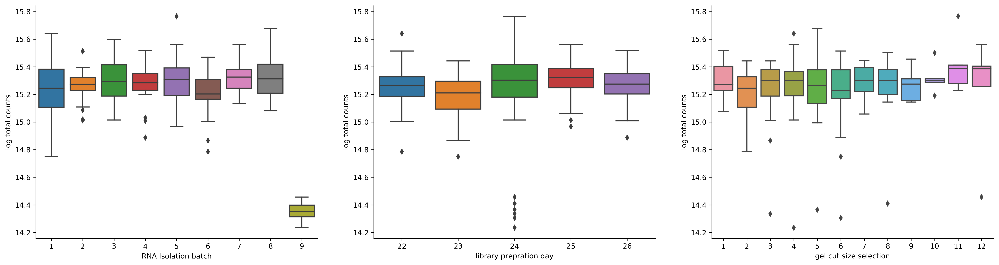

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

In [163]:
fig, ax = plt.subplots(1,3,figsize=(24, 6))
for  i in range(3):
    show_batch_total_counts(ax[i],batchtable, original_mx, batchindex = i)
plt.tight_layout()

### PCA batch with other normal dataset

In [164]:
def show_batch_sns(data,sampleclass,batchinfo,batch_ind=0):
    X = log_transfrom(data).T
    X = StandardScaler().fit_transform(X)
    method = 'UMAP'
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')

    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    plot_table = pd.concat((plot_table,batchinfo.loc[plot_table.index]),axis=1)
    #display(plot_table)
    batchnum = np.unique(plot_table.iloc[:,3+batch_ind]).shape[0]
    
    fig, ax = plt.subplots(1,figsize=(5, 5))
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",style="class",
                    palette=list(np.array(Category20c[20]).reshape(4,-1).T.ravel())[:batchnum],
                    #palette=np.array(Category20c[20])[np.arange(0,20,3)],
                    hue=plot_table.columns[3+batch_ind],s=50,alpha=0.7)
    legend = ax.legend(prop=fontlegend,
                      #labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False)#,markerscale=markerscale)
    ax.legend_.get_frame()._linewidth=0.5
    legend.get_title().set_fontweight('normal')
    legend.get_title().set_fontsize(6.5)
    std_plot(ax,'Dimension 1','Dimension 2')

In [187]:
uca_summary

,uca_score
preprocess_method,
filter.null.Norm_CPM_top.Batch_Combat_1,0.322917
filter.null.Norm_CPM.Batch_Combat_1,0.317708
filter.null.Norm_CPM.Batch_RUV,0.312500
filter.null.Norm_CPM_top.Batch_RUV,0.307292
filter.null.Norm_CPM.Batch_Combat_2,0.291667
filter.null.Norm_SCnorm.Batch_Combat_1,0.281250
filter.null.Norm_CPM_top.Batch_Combat_2,0.281250
filter.null.Norm_SCnorm.Batch_null,0.276042
filter.null.Norm_SCnorm.Batch_RUV,0.276042


In [186]:
mat_list = [i+'.'+exp_mx_name+'.txt' for i in uca_summary.index]
from rpy2.robjects import r
%load_ext rpy2.ipython
batch_index=1

In [167]:
exosome_small_mx = pd.read_table('output/exosome_small/count_matrix/domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)
embed_pdf_figure()

exosome_small_mx = pd.read_table('output/exosome_small/matrix_processing/filter.viper_count.Norm_RLE.Batch_Combat_1.domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)
embed_pdf_figure()

In [168]:
deleteclassindd = np.concatenate((np.where((exosome_small_class.label=='Pancreatic Cancer'))[0],np.where(exosome_small_class.label=='Prostate Cancer')[0]))

In [169]:
exosome_small_mx.shape

(5664, 206)

In [170]:
deleteclassindd

array([ 88, 112, 137, 162, 187, 188,  64,  65,  66,  67,  68,  69,  70,
        71,  89,  90,  91,  92,  93,  94,  95, 113, 114, 115, 116, 117,
       118, 119, 138, 139, 140, 141, 142, 143, 163, 164, 165, 166, 167,
       189, 190, 191])

In [173]:
exosome_small_mx = pd.read_table('output/exosome_small/count_matrix/domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)
embed_pdf_figure()

exosome_small_mx = pd.read_table('output/exosome_small/matrix_processing/filter.viper_count.Norm_RLE.Batch_Combat_1.domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)
embed_pdf_figure()

In [174]:
show_batch_sns(original_mx,sample_class,batchtable)
embed_pdf_figure()

### RNA batch by batch

In [185]:
def plot_rna_batch(ax,rnaname,typetable,batchtable,batchindex=1):
    '''
    typetable: table_ratio
    rnaname certain type pf rna
    '''
    counts = typetable.T.loc[rnaname].T
    sumtable = pd.DataFrame(counts)
    sumtable_whole = pd.concat((sumtable.loc[batchtable.index],batchtable),axis=1)
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y=rnaname,ax=ax)
    ax.set_title('batch effect: '+batchname+ ' by '+rnaname,size=16)
    plt.tight_layout()
fig, ax = plt.subplots(4,3,figsize=(30, 24))
for i in range(4):
    for j in range(3):
        plot_rna_batch(ax[i,j],rnanames[i],table_ratio,batchtable,batchindex=j)

### RLE batch

In [177]:
def plotRLE(mat,batch,log=False,batchindex=1):
    if log is not True:
        log_mat = log_transfrom(mat)
    else:
        log_mat = mat
    feature_meds = log_mat.apply(np.median,1).tolist()
    for i in np.arange(len(feature_meds)):
        log_mat.iloc[i] = log_mat.iloc[i] - feature_meds[i]
    mat_rle = log_mat
    stack = pd.DataFrame(mat_rle.stack())
    stack = stack.reset_index()
    stack.rename(columns={stack.columns[2]: "counts",
                          stack.columns[1]: "sample"},
                 inplace=True)
    stack['class'] = None
    if batch is not None:
        for samplename in np.unique(stack['sample']):
            stack['class'].iloc[np.where(stack['sample'] == samplename)] \
            = batch[batch.index==samplename].iloc[0,batchindex]

        fig,ax = plt.subplots(figsize=(7,7))
        ax = sns.boxplot(x='class',y='counts',data=stack,fliersize=0.1,linewidth=0.5)
        std_plot(ax,batch.columns[batchindex],'RLE')
    else:
        fig,ax = plt.subplots(figsize=(7,3.5))
        ax = sns.boxplot(x='sample',y='counts',data=stack,fliersize=0,linewidth=0.5)
        std_plot(ax,'sample','RLE')
    embed_pdf_figure()


plotRLE(batch_table,batchtable,batchindex=1)

### PCA batch

In [178]:
rnatype_list = unique([name.split('|')[1] for name in original_mx.index])

def get_mx_RNA_spec(table,rnatype):
    name_filter = np.where(array([name.split('|')[1] for name in table.index]) == rnatype)
    return table.iloc[name_filter]
merge = pd.DataFrame()
for rnatype in tqdm(rnatype_list):
    original_mx_rna = get_mx_RNA_spec(original_mx,rnatype)
    impute_table_rna = get_mx_RNA_spec(impute_table,rnatype)
    normalize_table_rna = get_mx_RNA_spec(normalize_table,rnatype)
    batch_table_rna = get_mx_RNA_spec(batch_table,rnatype)
    fig,ucalist = visualize_effect_all(original_mx_rna, impute_table_rna, normalize_table_rna, batch_table_rna, sample_class,method='UMAP')
    ucalist.rename(columns={ ucalist.columns[0]: rnatype }, inplace=True)
    merge = pd.concat([merge,ucalist],axis=1)
    fig.savefig(savepath+rnatype+'_batch'+saveformat)
    embed_pdf_figure(title=rnatype)
    
uca_rna_mx = merge
uca_rna_mx = uca_rna_mx.T.sort_values(by='Original matrix', ascending=False).T
uca_rna_mx.columns.name = 'rnatype'
uca_rna_stack = pd.DataFrame(uca_rna_mx.stack())
uca_rna_stack = uca_rna_stack.reset_index()
uca_rna_stack.rename(columns={ uca_rna_stack.columns[2]: "uca_score" }, inplace=True)
uca_rna_stack.rename(columns={ uca_rna_stack.columns[0]: "process" }, inplace=True)


HBox(children=(IntProgress(value=0, max=10), HTML(value='')))

In [179]:
fig,ax=plt.subplots(figsize=(7,4))
ax = sns.barplot(x="rnatype", y="uca_score", hue="process", data=uca_rna_stack)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,horizontalalignment='right')
std_plot(ax,'RNA types','UCA scores',legendtitle='Processes',legendsort=False,borderpad=0.2,labelspacing=0.2)
fig.savefig(savepath+'UCAscores_of_RNA_batch_bar'+saveformat)
fig.tight_layout()
embed_pdf_figure()

### feature batch by batch box

In [180]:
def featureplot_total_batch(ax,stack_batch,batchtable,batchindex=1):
    sns.boxplot(ax=ax,data=stack_batch,x=batchtable.columns[batchindex],y='counts',color='grey',linewidth=1,fliersize=0.1)
    std_plot(ax,batchtable.columns[batchindex],'feature counts')#,title='batch effect: '+batchtable.columns[batchindex]+ ' by '+'feature counts'
    
def stack_merge(exp_table,batch,log=False):
    if log is False:
        exp_table = log_transfrom(exp_table)
    stack = pd.DataFrame(exp_table.stack())
    stack = stack.reset_index()
    stack['rnaname'] = [featurename.split('|')[1] for featurename in stack.iloc[:,0].tolist()]
    stack.rename(columns={stack.columns[2]: "counts",
                          stack.columns[1]: "sample",
                          stack.columns[0]: "feature"},
                 inplace=True)
    stack = stack.set_index('sample')
    stack_batch = pd.concat([stack,batchtable],axis=1,join_axes=[stack.index])
    stack_batch = stack_batch.reset_index()    
    return(stack_batch)

stack_batch = stack_merge(batch_table,batchtable)
fig, ax = plt.subplots(1,3,figsize=(7, 2))
for i in arange(3):
    featureplot_total_batch(ax[i],stack_batch,batchtable,batchindex=i)
plt.tight_layout()
embed_pdf_figure()

In [181]:
def featureplot_rna_batch(ax,rnano,stack_batch,batchtable,batchindex=1):
    rnaname = unique(stack_batch['rnaname'])
    stack_batch_rna = stack_batch[stack_batch['rnaname']==rnaname[rnano]]
    sns.boxplot(ax=ax,data=stack_batch_rna,x=batchtable.columns[batchindex],y='counts',color='grey',linewidth=1,fliersize=0.1)
    std_plot(ax,batchtable.columns[batchindex],rnaname[rnano],title='batch effect: '+batchtable.columns[batchindex]+ ' by '+rnaname[rnano])

stack_batch = stack_merge(batch_table,batchtable)
fig, ax = plt.subplots(4,3,figsize=(7, 5.5))
for i in arange(4):
    for j in arange(3):
        featureplot_rna_batch(ax[i,j],i,stack_batch,batchtable,batchindex=j)
#featureplot_rna_batch(ax[0,0],rnanames[2],stack_batch,batchtable,batchindex=2)
#featureplot_rna_batch(ax[0,1],rnanames[2],stack_batch,batchtable,batchindex=2)
#featureplot_rna_batch(ax[1,1],rnanames[2],stack_batch,batchtable,batchindex=2)
plt.tight_layout()
embed_pdf_figure()

# Evaluation

In [1091]:
def summarize_feature_selection(output_dir):
    metrics = []
    features = []
    pbar = tqdm(unit='directory')
    dirstack = []
    for count_method in os.listdir(os.path.join(output_dir, 'select_preprocess_method', 'combined_score')):
        preprocess_method = open(os.path.join(output_dir, 'select_preprocess_method', 'combined_score', count_method, 'selected_methods.txt')).readline().strip()
        dirstack.append(os.path.join(output_dir, 'cross_validation', preprocess_method + '.' + count_method))
        for compare_group in os.listdir(dirstack[-1]):
            dirstack.append(os.path.join(dirstack[-1], compare_group))
            for feature_selection_method in os.listdir(dirstack[-1]):
                classifier, n_select, select_method, fold_change_direction  = feature_selection_method.split('.')
                metadata = {
                    'compare_group': compare_group,
                    'classifier': classifier,
                    'n_features': n_select,
                    'fold_change_direction': fold_change_direction,
                    'preprocess_method': preprocess_method,
                    'count_method': count_method
                }
                try:
                    df = pd.read_table(os.path.join(dirstack[-1], feature_selection_method, 'metrics.test.txt'), sep='\t')
                except IOError:
                    continue
                df_metadata = pd.DataFrame(index=np.arange(df.shape[0]))
                for key, val in metadata.items():
                    df_metadata[key] = val
                metrics.append(pd.concat([df_metadata, df], axis=1))
                pbar.update(1)
            dirstack.pop()
        dirstack.pop()
    metrics = pd.concat(metrics, axis=0)
    return metrics

metrics = summarize_feature_selection('output/'+dataset)

#newdf = df[(df['fold_change_direction']==value_change)&(df['classifier']==classifier_use)]
#metrics=pd.read_table('output/scirep/summary/cross_validation/metrics.train.txt')
newdf=metrics
newdf.index = newdf.compare_group
newdf['preprocess_methods'] = np.array([newdf.preprocess_method[i]+'.'+newdf.count_method[i] for i in range(newdf.shape[0])])
compare_list_use = np.array(['Normal-CRC','Normal-CRC_S1',#'Normal-PAAD',
                             'Normal-PRAD','Normal-HCC'])
tmpdict = {}
for i in np.unique(newdf.index): 
    if np.isin(i,compare_list_use):
        print(i)
        tmpdict[i] = np.unique(newdf.loc[i].preprocess_methods)

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

Normal-CRC
Normal-CRC_S1
Normal-PRAD


In [1092]:
#mirna_and_domains, mirna_and_long_bg, transcript_mirna
def interactive_config_settings(dataset,sequencing_type,classifier,value_change,example_cancer,reads_preprocess,stage_info,saveformat):
    if sequencing_type == 'short':
        exp_mx_name = 'mirna_and_domains'#'domains_combined'
    elif sequencing_type == 'mirna_and_long_bg':
        exp_mx_name = 'mirna_and_long_bg'
    elif sequencing_type == 'transcript_mirna':
        exp_mx_name = 'transcript_mirna'
    elif sequencing_type =='long':
        exp_mx_name = 'featurecounts'
    elif sequencing_type =='domain_only':
        exp_mx_name = 'domains_long'
    elif sequencing_type =='transcript':
        exp_mx_name = 'transcript'
    elif sequencing_type =='transcript_small':
        exp_mx_name = 'transcript_small'
    elif sequencing_type =='transcript_long_bg':
        exp_mx_name = 'transcript_long_bg'
    return dataset,sequencing_type,classifier,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info,saveformat

widget =interactive(interactive_config_settings,
           dataset= ['scirep','exorbase','exosome_small','pico_3v3'],
           sequencing_type=['short','mirna_and_long_bg','transcript_mirna','long','domain_only','transcript','transcript_small','transcript_long_bg'],
           classifier = ['random_forest','logistic_regression','linear_svm','decision_tree','logistic_regression_l1'],
           value_change = ['any','up','down'],
        example_cancer=['Normal-CRC','Normal-PAAD','Normal-PRAD','Normal-HCC'],
                   reads_preprocess=[True,False],
                   stage_info = ['No Stage','With Stage'],
                   saveformat=['.pdf','.eps'])  # if start from preprocessing
display(widget)


interactive(children=(Dropdown(description='dataset', options=('scirep', 'exorbase', 'exosome_small', 'pico_3v3'), value='scirep'), Dropdown(description='sequencing_type', options=('short', 'mirna_and_long_bg', 'transcript_mirna', 'long', 'domain_only', 'transcript', 'transcript_small', 'transcript_long_bg'), value='short'), Dropdown(description='classifier', options=('random_forest', 'logistic_regression', 'linear_svm', 'decision_tree', 'logistic_regression_l1'), value='random_forest'), Dropdown(description='value_change', options=('any', 'up', 'down'), value='any'), Dropdown(description='example_cancer', options=('Normal-CRC', 'Normal-PAAD', 'Normal-PRAD', 'Normal-HCC'), value='Normal-CRC'), Dropdown(description='reads_preprocess', options=(True, False), value=True), Dropdown(description='stage_info', options=('No Stage', 'With Stage'), value='No Stage'), Dropdown(description='saveformat', options=('.pdf', '.eps'), value='.pdf'), Output()), _dom_classes=('widget-interact',))

In [1104]:
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info,saveformat = widget.result
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info,saveformat

('scirep',
 'short',
 'random_forest',
 'up',
 'mirna_and_domains',
 'Normal-CRC',
 True,
 'No Stage',
 '.pdf')

In [1105]:
file_counts = 'output/'+dataset+'/summary/read_counts.txt'
file_length_path = 'output/'+dataset+'/stats/mapped_read_length_by_sample/'
file_length_path_insert = 'output/'+dataset+'/stats/mapped_insert_size_by_sample/'
plot_save_path = 'output/'+dataset+'/plots/'

    
import datetime
now = datetime.datetime.now()
timenow = '{}.{}.{}.{}:{}'.format(now.year,now.month,now.day,now.hour,now.minute)
savepath = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'
save_path = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'

if not os.path.exists(savepath):
    os.mkdir(savepath)

In [1106]:
if dataset=='scirep':
    if stage_info =='No Stage':
        class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
    else:
        class_info = 'data/'+dataset+'/sample_classes.txt'

## feature recurrence

In [1096]:
preprocess_method  =tmpdict['Normal-CRC_S1']
preprocess_method = preprocess_method[np.where(np.array([preprocess_method[i].split('.')[-1] for i in range(preprocess_method.shape[0])])==exp_mx_name)][0]
processed_matrix = pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt',sep='\t',index_col=0)
class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
class_compare2 = np.array([ 'Colorectal Cancer', 'Healthy Control'])
candi_index1 = np.array(['chr17_66755840_66755880_+|genomic|chr17_66755840_66755880_+|peak_3193|chr17|66755840|66755880'
                       ])
candi_index2 = np.array(['ENSG00000276788.1|snoRNA|SNORD26|peak_721|ENST00000384147.1|20|75'
                       ])
calculate_fc(processed_matrix, candi_index1,sample_class,class_compare,cpm_table_origin)[0]
calculate_fc(processed_matrix, candi_index2,sample_class,class_compare2,cpm_table_origin)[0]

In [1107]:
cpm_table_origin_ = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'.txt')
cpm_table_origin =  cpm_table_origin_/cpm_table_origin_.sum(axis=0)*10e6
length_tmp = np.array([cpm_table_origin.index[i].split('|')[-1] for i in range(cpm_table_origin.index.shape[0])]).astype('int')-\
np.array([cpm_table_origin.index[i].split('|')[-2] for i in range(cpm_table_origin.index.shape[0])]).astype('int')
rpkm_table_origin = (cpm_table_origin_.T/length_tmp*1000).T


def calculate_fc(table,original_index,sample_class, class_compare,cpm_table_origin):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    sample_class_use = sample_class.iloc[np.isin(sample_class.label,class_compare)]
    sample_class_1_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[0])]
    sample_class_2_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[1])]
    table_selected = table.loc[original_index]
    length = np.array([cpm_table_origin.index[i].split('|')[-1] for i in range(cpm_table_origin.index.shape[0])]).astype('int')-\
np.array([cpm_table_origin.index[i].split('|')[-2] for i in range(cpm_table_origin.index.shape[0])]).astype('int')
    #print (length)

    rpkmtable = (cpm_table_origin.T/length).T*1000
    #display(rpkmtable)
    #display(table_selected)
    rpkmtable_ = pd.concat((rpkmtable.loc[original_index,sample_class_1_use.index],
               rpkmtable.loc[original_index,sample_class_2_use.index]),axis=1)
    cpmtable_ = pd.concat((cpm_table_origin.loc[original_index,sample_class_1_use.index],
               cpm_table_origin.loc[original_index,sample_class_2_use.index]),axis=1)
    if dataset =='scirep':
        rpkmtable=cpmtable_
    elif dataset=='exorbase':
        rpkmtable=rpkmtable_
    return np.mean(log_transfrom(table_selected.loc[:,sample_class_1_use.index]),axis=1) -\
np.mean(log_transfrom(table_selected.loc[:,sample_class_2_use.index]),axis=1),rpkmtable_,cpmtable_
def compare_features(path,sample_class,class_compare,compare_group,savepath=savepath,save_table=True):
    pbar = tqdm(unit='directory')
    feature_lists = {}
    for feature_selection_method in os.listdir(path):
        classifier, n_features, select_method,value_changes  = feature_selection_method.split('.')
        if classifier==classifier_use:
            n_features = int(n_features)
            if n_features > 10:
                continue
            # feature importance
            if value_changes == value_change:
                print (feature_selection_method)
                feature_lists[n_features] = pd.read_table(os.path.join(path,
                    feature_selection_method, 'feature_importances.txt'), header=None, index_col=0).iloc[:, 0]
                feature_lists[n_features].index = feature_lists[n_features].index.astype('str')
                pbar.update(1)
    # feature union set
    feature_set = reduce(np.union1d, [a.index.values for a in feature_lists.values()])
    # build feature importance matrix
    feature_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    #print (feature_matrix.shape)
    for n_features, feature_importance in feature_lists.items():
        feature_matrix.loc[feature_importance.index.values, n_features] = feature_importance.values
    feature_matrix.columns = feature_matrix.columns.astype('int')
    feature_matrix.index = feature_matrix.index.astype('str')
    
    feature_matrix = feature_matrix.loc[:, feature_matrix.columns.sort_values().values]
    original_index = feature_matrix.index
    feature_info = feature_matrix.index.to_series().str.split('|', expand=True)
    feature_info.columns = ['gene_id', 'gene_type', 'gene_name', 'feature_id', 'transcript_id', 'start', 'end']

    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values \
    
    # build feature indicator matrix
    feature_indicator_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    for n_features, feature_importance in feature_lists.items():
        feature_indicator_matrix.loc[feature_importance.index.values, n_features] = 1
    feature_indicator_matrix.columns = feature_indicator_matrix.columns.astype('int')
    feature_indicator_matrix = feature_indicator_matrix.loc[:, feature_indicator_matrix.columns.sort_values().values]
    
    feature_indicator_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values
    #fig, ax = plt.subplots(figsize=(6, 8))
    #sns.heatmap(feature_indicator_matrix,
    #            cmap=sns.light_palette('green', as_cmap=True), cbar=False, ax=ax, linewidth=1)
    #ax.set_xlabel('Number of features')
    #ax.set_ylabel('Features')
    #display(processed_matrix)
    foldchange,rpkmtable,cpmtable = calculate_fc(processed_matrix, original_index,sample_class,class_compare,cpm_table_origin)
    foldchange.index = feature_matrix.index
    feature_matrix = pd.concat((feature_matrix,foldchange),axis=1)
    #display(feature_matrix) 
    if feature_matrix.shape[1]==2:
        feature_matrix.columns = np.concatenate((np.array([10]).astype('str'),np.array(['fold change'])))
    else:
        feature_matrix.columns = np.concatenate((np.arange(1,11).astype('str'),np.array(['fold change'])))
    #display (feature_matrix)
    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
    + '|' + feature_info.loc[:, 'feature_id'].values \
        + '|' + feature_info.loc[:, 'transcript_id'].values
    #display (feature_matrix)
    display(feature_matrix.style\
        .background_gradient(cmap=sns.light_palette('green', as_cmap=True))\
        .set_precision(2)\
        .set_caption(path))
    pbar.close()
    if save_table:
        feature_matrix.to_csv(savepath+compare_group+'_feature_table.txt',sep='\t')
    return feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpmtable

In [1108]:
def scale(axis,table):
    '''
    axis: 0(by sample)/1(by feature)/2(both 0 and 1)
    '''
    scaler = StandardScaler()
    arr = np.array(table)
    if axis==0:
        return scaler.fit_transform(arr)
    elif axis==1:
        return scaler.fit_transform(arr.T).T
    elif axis==2:
        return scaler.fit_transform(scaler.fit_transform(arr).T).T
def clustermap(processed_matrix,featurename,sample_class, class_compare,compare_group,savepath=savepath,savefig=True,plot=False):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    #samples_use = np.loadtxt(output_feature_selection_path+'{}/{}'.format(preprocess_method,compare_group)+)
    #display(sample_class.loc[samples_use])
    sample_class_use = sample_class.loc[samples_use].iloc[np.isin(sample_class.loc[samples_use].label,class_compare)]
    cpm_table = processed_matrix
    cpm_table_use = cpm_table.loc[featurename,samples_use]
    #display(cpm_table_use)
    cpm_matrix= log_transfrom(np.array(cpm_table_use))
    cpm_table_use.iloc[:,:] = RobustScaler().fit_transform(cpm_matrix.T).T
    rgblabel = np.repeat('r',samples_use.shape[0])
    rgblabel[np.where(sample_class_use.label==class_compare[-1])] = 'b'
    cpm_table_use_ = cpm_table_use
    whole_index = cpm_table_use.index
    cpm_table_use.index = np.array([cpm_table_use.index[i].split('|')[2]+'|'+cpm_table_use.index[i].split('|')[1] for i in range(cpm_table_use.index.shape[0]) ])
    if plot:
        sns_plot = sns.clustermap(cpm_table_use,cmap='vlag',figsize=(70,20),col_colors=rgblabel)
        if savefig:
            sns_plot.savefig(savepath+compare_group+'_clustermap'+saveformat, bbox_inches='tight')
    cpm_table_use_.index = whole_index
    return cpm_table_use,sample_class_use,cpm_table_use_


In [1109]:
output_feature_selection_path = 'output/'+dataset+'/cross_validation/'
feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpm_table_use,sample_class_use,cpmtable,cpm_table_use_ = {},{},{},{},{},{},{},{},{}
for compare_group, preprocess_method in tqdm(tmpdict.items()):
    #print (compare_group,preprocess_method)
    preprocess_method = preprocess_method[np.where(np.array([preprocess_method[i].split('.')[-1] for i in range(preprocess_method.shape[0])])==exp_mx_name)][0]
    #compare_group = compare_group[0]            
    class_info = 'data/'+dataset+'/sample_classes.txt'
    if dataset =='scirep':
        if compare_group=='Normal-CRC':
            class_compare = np.array(['Colorectal Cancer', 'Healthy Control'])
            class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['Prostate Cancer', 'Healthy Control']) 
            class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
        elif compare_group=='Normal-PRAD':
            class_compare = np.array(['Pancreatic Cancer', 'Healthy Control']) 
            class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
    elif dataset =='lulab_hcc':
        if compare_group=='Normal-HCC':
            class_info = 'data_old/labels/sample_classes_hcc.txt'
            class_compare = np.array(['HCC', 'Normal']) 
        elif compare_group=='Normal-stage_A':
            class_compare = np.array(['stage_A', 'Normal']) 
    elif dataset =='exorbase':
        if compare_group=='Normal-HCC':
            class_compare = np.array(['HCC', 'Healthy']) 
        elif compare_group=='Normal-CRC':
            class_compare = np.array(['CRC', 'Healthy']) 
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['PAAD', 'Healthy']) 
    sample_class = pd.read_table(class_info,sep='\t',index_col=0)
    processed_matrix = pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt',sep='\t',index_col=0)
    feature_matrix[compare_group],feature_indicator_matrix[compare_group],\
    original_index[compare_group],foldchange[compare_group],rpkmtable[compare_group],cpmtable[compare_group] = compare_features(output_feature_selection_path+'{}/{}'.format(preprocess_method,compare_group),sample_class,class_compare,compare_group)
    features =  feature_matrix[compare_group].index
    cpm_table_use[compare_group],sample_class_use[compare_group],cpm_table_use_[compare_group] =  clustermap(processed_matrix,original_index[compare_group],sample_class,class_compare,compare_group,plot=0)
    cpm_table_use_[compare_group].to_csv(save_path+'selected_feature_cpm_'+compare_group+'.txt',sep='\t')

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

random_forest.10.robust.up


,10,fold change
21915|tRNA|peak_126|21915,0.052,0.098
30984|tRNA|peak_320|30984,0.14,0.34
33463|tRNA|peak_352|33463,0.078,0.25
Y_RNA|Y_RNA|peak_537|ENST00000362602.1,0.1,0.37
Y_RNA|Y_RNA|peak_591|ENST00000363781.1,0.051,0.19
Y_RNA|Y_RNA|peak_631|ENST00000364886.1,0.083,0.32
Y_RNA|Y_RNA|peak_743|ENST00000384478.1,0.14,0.32
Y_RNA|Y_RNA|peak_750|ENST00000384562.1,0.058,0.27
RNU2-33P|snRNA|peak_810|ENST00000410344.1,0.14,0.34
RNU2-6P|snRNA|peak_847|ENST00000411404.1,0.15,0.31


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

random_forest.10.robust.up


,10,fold change
25608|tRNA|peak_183|25608,0.15,0.17
26876|tRNA|peak_212|26876,0.2,0.14
30343|tRNA|peak_269|30343,0.047,0.34
30801|tRNA|peak_286|30801,0.11,0.18
34164|tRNA|peak_359|34164,0.16,0.36
RNU12|snRNA|peak_532|ENST00000362512.1,0.068,0.083
AC108134.2|lncRNA|peak_1322|ENST00000570843.1,0.11,0.2
chr12_98504240_98504340_+|genomic|peak_2566|chr12,0.082,0.32
chr17_43025280_43025320_-|genomic|peak_3159|chr17,0.046,0.15
chr4_166142580_166142640_+|genomic|peak_4337|chr4,0.027,0.33


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

random_forest.10.robust.up


,10,fold change
hsa-miR-125a-3p|miRNA|hsa-miR-125a-3p|hsa-miR-125a-3p,0.092,0.13
hsa-miR-125b-1-3p|miRNA|hsa-miR-125b-1-3p|hsa-miR-125b-1-3p,0.13,0.068
hsa-miR-130a-3p|miRNA|hsa-miR-130a-3p|hsa-miR-130a-3p,0.043,0.1
hsa-miR-22-5p|miRNA|hsa-miR-22-5p|hsa-miR-22-5p,0.098,0.1
hsa-miR-410-3p|miRNA|hsa-miR-410-3p|hsa-miR-410-3p,0.093,0.088
hsa-miR-760|miRNA|hsa-miR-760|hsa-miR-760,0.06,0.12
30984|tRNA|peak_320|30984,0.29,0.33
G029527|tucpRNA|peak_1697|T126465,0.049,0.15
chr16_985540_985580_-|genomic|peak_2953|chr16,0.06,0.099
chr5_163650020_163650060_+|genomic|peak_4535|chr5,0.091,0.047


## bar plot of feature importance

In [1110]:
filtered_mx = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'.txt')
filtered_mx.index =  np.array([filtered_mx.index[i].split('|')[2]+'|'+filtered_mx.index[i].split('|')[1]+'|'+filtered_mx.index[i].split('|')[3]+'|'+filtered_mx.index[i].split('|')[4] for i in range(filtered_mx.index.shape[0])])


In [1111]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridisBig = cm.get_cmap('BuGn', 512)
newcmp = ListedColormap(viridisBig(np.linspace(0.4, 1, 256)))

def weight_bar_plt(weight=None,recurrence=None,rpkm=None,de=None,area_=(6.0,8.0),nameshort=True,savefig=True):
    weight.rename(columns={ weight.columns[0]: "weight" }, inplace=True)
    recurrence.rename(columns={ recurrence.columns[0]: "recurrence" }, inplace=True)
    de['name_cut'] = [featurename.split('|')[2] + '|' +\
                      featurename.split('|')[1] + '|' +\
                      featurename.split('|')[3] + '|' +\
                      featurename.split('|')[4]\
                      for featurename in de.index]
    de = de.set_index('name_cut')
    rpkm['name_cut'] = [featurename.split('|')[2] + '|' +\
                        featurename.split('|')[1] + '|' +\
                        featurename.split('|')[3] + '|' +\
                        featurename.split('|')[4]\
                        for featurename in rpkm.index]
    rpkm = rpkm.set_index('name_cut')
    weight = weight.sort_values('weight',ascending=False)
    index = weight.index
    plot_mx = pd.DataFrame({'weight':weight['weight'],
                  'rpkm':rpkm.loc[index].mean(axis=1),
                  'recurrence':recurrence.loc[index]['recurrence'],
                  'fc':de.loc[index]['log2FoldChange'],
                  'qvalue':de.loc[index]['padj']})
    plot_mx['-log10(qvalue)'] = -np.log10(plot_mx['qvalue']+0.01)
    plot_mx['log2RPKM'] = log_transfrom(plot_mx['rpkm'])

    if nameshort is True:
        plot_mx['nameshort'] = [i.split('|')[0] for i in index]
        plot_mx = plot_mx.set_index('nameshort')
        plot_mx.index.name=''
    fig, (ax_,ax, ax1) = plt.subplots(1,3, figsize=(7,3),gridspec_kw = {'width_ratios':[(1.5-nameshort)*2,2,2]})
    ax_.axis('off')
    #im = ax.scatter(plot_mx['weight'],plot_mx.index,s=((plot_mx['log2RPKM']/area_[0]-0.5)*area_[1])**2,c=plot_mx['recurrence'],cmap='BuGn')
    im = ax.scatter(plot_mx['weight'],plot_mx.index,s=((plot_mx['log2RPKM']/area_[0]-0.5)*area_[1])**2,c=plot_mx['recurrence'],cmap=newcmp)
    cbar =fig.colorbar(im, ax=ax)
    cbar.outline.set_visible(False)
    interval = np.max(plot_mx.log2RPKM) - np.min(plot_mx.log2RPKM)
    ratiointer = interval/4
    pws = set(np.round(np.arange(np.min(plot_mx.log2RPKM),np.max(plot_mx.log2RPKM),ratiointer),0).astype(int))
    for pw in pws:
        ax.scatter([], [], s=((pw/area_[0]-0.5)*area_[1])**2, c="k",label=str(pw))
    ax = std_plot(ax,'Feature Weight','Feature Name',None,'log(RPKM)',
                      borderpad=1,labelspacing=1.7,handletextpad=1,cbar=cbar,cbarlabel='Feature Recurrency',xlim=[0,np.max(plot_mx['weight'])+0.1])
                      #,ylim=[-0.5,nums_retain-0.5])
    #print(np.max(plot_mx['weight']))

    plot = ax1.scatter(plot_mx.index, plot_mx['fc'], c=plot_mx['-log10(qvalue)'], cmap='Reds')
    ax1.clear()
    sns.barplot(ax=ax1,data=plot_mx[::-1],y=plot_mx[::-1].index,x='fc',palette='Reds',hue='-log10(qvalue)',dodge=False)
    ax1.get_legend().remove()
    cbar = fig.colorbar(plot,ax=ax1)
    cbar.outline.set_visible(False)
    ax1 = std_plot(ax1,'Fold Change','','weight bar plot '+compare_group,moveyaxis=True,cbar=cbar,cbarlabel='-log10(q value)')
    ax1.set_yticks([])
    #fig.tight_layout()
    with embed_pdf_data() as data:
        fig.savefig(data, format='pdf', metadata={'Title': 'Weight Bar Plot '+compare_group})
    if savefig:
        fig.savefig(savepath+compare_group+'_weight_bar'+saveformat)
    return plot_mx.index
selected_features = {}
count = 0
scalefactor=np.array([0.6,0.8,0.5,0.5,0.5,0.5,0.5])*300
for compare_group, preprocess_method in tqdm(tmpdict.items()): 
    preprocess_method = preprocess_method[np.where(np.array([preprocess_method[i].split('.')[-1] for i in range(preprocess_method.shape[0])])==exp_mx_name)][0]
    
    if sequencing_type =='long':
        tmptable = rpkmtable[compare_group]
    else:
        tmptable = cpmtable[compare_group]
    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                       ,index_col=0) 
    #display(detable)
    #print ('output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'.10.robust.'+value_change+'/cross_validation.h5')
    with h5py.File('output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'.10.robust.'+value_change+'/cross_validation.h5') as f:
        feature_selection_matrix = f['feature_selection'][:]
    tmprecurrencedf = pd.DataFrame(feature_selection_matrix.mean(axis=0))
    tmprecurrencedf.index = filtered_mx.index                                 
    detable=detable.fillna(1)
    selected_features[compare_group] =weight_bar_plt(feature_matrix[compare_group],tmprecurrencedf,tmptable,detable,(6.0,8.0),False)
    #selected_features[compare_group] = feature_weight_bar(feature_matrix[compare_group],detable,tmprecurrencedf,
      #            10,original_index=original_index[compare_group],rpkmtable=tmptable,
      #                           compare_group=compare_group,scalefactor=scalefactor[count],area_=(8.0,9.0),namelength=3)
    count+=1

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

## ROC: selected feature classification result

In [553]:
def find_metrics_best_for_shuffle(fpr,tpr):
    '''
    used for shuffle roc plot
    '''
    a = 1 - fpr 
    b = tpr
    Sensitivity = b
    Specificity = a
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    auc = sklearn.metrics.auc(a,b)
    thres = 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def get_probs_split(filename,interpolatednum=10000,confidence=0.95):
    '''
    get probs from split
    use interpolation to calculate CI
    '''
    xvals = np.linspace(0, 1, interpolatednum)
    with h5py.File(filename,'r') as f:
        predictions =  f['predictions'][:]
        train_index =  f['train_index'][:]
        label = f['labels'][:]
    probs,labels,interpolatedvalue = {},{},{}
    for i in range(predictions.shape[0]):
        probs[i] = predictions[i][~train_index[i]]
        labels[i] = label[~train_index[i]]
        interpolatedvalue[i] = np.interp(xvals,plot_roc( probs[i],labels[i])[1],plot_roc( probs[i],labels[i])[2] )
    interarray = np.array([interpolatedvalue[i]  for i in range(predictions.shape[0])])
    mean,minimum,maximum = np.ndarray([interpolatednum]),np.ndarray([interpolatednum]),np.ndarray([interpolatednum])
    for i in range(interpolatednum):
        mean[i],minimum[i],maximum[i] = mean_confidence_interval(interarray[:,i],confidence)
    return np.concatenate((np.zeros(1),mean,np.ones(1))),np.concatenate((np.zeros(1),minimum,np.ones(1))),\
np.concatenate((np.zeros(1),maximum,np.ones(1))),interpolatednum+2
def plot_roc(prob,label):
    fpr, tpr, _ = roc_curve(label, prob)
    roc_auc = sklearn.metrics.auc(fpr, tpr)
    return roc_auc,fpr, tpr
def find_metrics_best(label,expressionlevel):
    posinum = np.sum(label)
    neganum = label.shape[0] - np.sum(label)
    a,b,c= roc_curve(label,expressionlevel) #fpr tpr threshold
    fp = a*neganum
    tp = b*posinum
    tn = (1-a)*neganum
    fn = (1-b)*posinum
    #Sensitivity = tp/(tp+fn) 
    #Specificity = tn/(tn+fp) 
    Sensitivity = b
    Specificity = 1 - a
    PPV = tp/(tp+fp) 
    NPV = tn/(tn+fn) 
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    mcc_mean = (tp*tn-fp*fn)/(((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))**0.5)
    F1_score = 2*tp/(2*tp+fn+fp)
    auc = sklearn.metrics.auc(a,b)
    acc = (tp+tn)/(tp+tn+fn+fp)
    distoleftup = (a**2+(1-b)**2)**0.5# to the left up
    #print ("AUC:" +str(auc)) 
    thres = int(label.shape[0]/10.) if int(label.shape[0]/10.)>0 else 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres],np.argsort(-mcc_mean)[:thres],np.argsort(-F1_score)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def get_auc_stats(root_path,sample_path):
    '''
    sample_path:hccpath,stagepath
    '''
    auc_metrics_jack = {}
    auc_metrics_split = {}
    for i in os.listdir(root_path+sample_path):
        #print (i)
        try:
            print (i, ' file found')
            if i.split('.')[-1] == 'shuffle_split':
                auc_metrics_split[i] = h5py.File(root_path+sample_path+i+'/evaluation.shuffle_split.h5')
            else:
                with h5py.File(root_path+sample_path+i+'/evaluation.leave_one_out.h5','r') as f:
                    predictions =  f['predictions'][:]
                    train_index =  f['train_index'][:]
                    auc_metrics_jack[i]  = predictions[~train_index]
        except:
            print (i, ' file not found')
            print ('files in the directory: ',os.listdir(root_path+sample_path+i))
    return auc_metrics_jack,auc_metrics_split
def get_speci_sensi(filename,spe_criteria=0.99):
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    total_nums = mean.shape[0]
    index = round(total_nums *(1-spe_criteria))
    return mean[index],minimum[index],maximum[index]

In [554]:
def plot_shuffle(ax,filename,filename_,show_metrics=False,savefigure=False,title=None,
                 spe_criter=0.99,savepath=savepath,savefig=True,
                 compare_group=None,markers_file=None,marker_roc_ind = np.array([0]),markername=None,
                show_up_value=True):
    '''
    samplepath: hccpath
    filename: 'logistic_regression.100.robust.stratified_shuffle_split/evaluation.stratified_shuffle_split.h5'
    '''  
    if markers_file is not None:
        markers_auc = {}
        for i in range(markers_file.shape[0]):
            mean,_,_,interpolatednum = get_probs_split(markers_file[i])
            xvals = np.linspace(0, 1, interpolatednum)  
            auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
            if np.isin(i,marker_roc_ind):
               # print (markername[marker_roc_ind[i]],marker_roc_ind[i])
                ax.plot(xvals,mean,linewidth=1.5,color='gray',label=markername[i]+' AUC: '+str(np.round(auc,3)))
            markers_auc[i],_,_ = find_metrics_best_for_shuffle(xvals,mean)
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    xvals = np.linspace(0, 1, interpolatednum)
    #ax.fill_between(xvals,minimum,maximum,where=(minimum<=maximum),color='b',alpha=0.1)   
    auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
    candidatevalue = auc
    numind = np.ceil((1-spe)/(1./(interpolatednum-2))).astype('int')
    ax.plot(xvals,mean,linewidth=2,color=Category20c[20][1],label='candidate AUC: '+str(np.round(auc,3)))

    if show_up_value:
        mean,minimum,maximum,interpolatednum = get_probs_split(filename_)
        xvals = np.linspace(0, 1, interpolatednum)
        #ax.fill_between(xvals,minimum,maximum,where=(minimum<=maximum),color='b',alpha=0.1)   
        auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
        candidatevalue = auc
        numind = np.ceil((1-spe)/(1./(interpolatednum-2))).astype('int')
        ax.plot(xvals,mean,linewidth=2,color=Category20c[20][10],label='candidate direction up AUC: '+str(np.round(auc,3)))

        
    h,l = ax.get_legend_handles_labels()
    legend = ax.legend(h,l)
    sen_criter = get_speci_sensi(filename,spe_criteria=spe_criter)[0]
    if show_metrics:
        if sen+0.2<=0.95:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe, sen+0.2),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=2.5),
            )
        else:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe+0.05, sen-0.2),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=2.5),
            )
        ax.annotate('Sensitivity '+str('%0.4s'%sen), xy=( 1-spe,sen), xytext=(1-spe+0.1, sen-0.1),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.1,width=1.5,headwidth=2.5),
            )
    ax.annotate('Sensitivity '+str('%0.4s'%sen_criter), xy=( 1-spe_criter,sen_criter), xytext=(1-spe_criter+0.1, sen_criter),size=6.5,
        arrowprops=dict(facecolor='black', shrink=0.8,width=1.5,headwidth=2.5),
        )
    ax = std_plot(ax,'False Positive Rate','True Positive Rate',title,'Marker',legendsort=False,borderpad=0.4,handletextpad=0.4)
    ax.plot([0,1],[0,1], linewidth=2,alpha=0.6,color='gray',linestyle='--')
    #ax.set_yticklabels(np.arange(0,12,2)/10,fontticklabel)
    #ax.set_xticklabels(np.arange(0,12,2)/10,fontticklabel)
    if savefig:
        fig.savefig(savepath+compare_group+'_ROC'+saveformat, bbox_inches='tight')
    #fig.tight_layout()
    with embed_pdf_data() as data:
        fig.savefig(data, format='pdf', metadata={'Title': '123'})
    #return mean,minimum,maximum,interpolatednum
    
    return markers_auc,candidatevalue

valuate_features/control_markers_0/filter.null.Norm_SCnorm.Batch_Combat_2.transcript_long_bg/Normal-CRC/random_forest/

In [555]:
control_markers = {}
control_markers['Normal-CRC'] = {}
#control_markers['Normal-CRC'][0] = np.array(['hsa-miR-92a-3p','hsa-miR-92b-3p',
 #                                            'hsa-miR-92b-5p','hsa-miR-21-3p',
  #                                          'hsa-miR-21-5p','hsa-miR-139-3p',
    #                                        'hsa-miR-139-5p','hsa-miR-431-3p','hsa-miR-431-5sp'])
control_markers['Normal-CRC'][1] =np.array(['hsa-miR-20a-5p'])
control_markers['Normal-CRC'][2] =np.array(['hsa-miR-26a-5p'])
control_markers['Normal-CRC'][3] =np.array(['hsa-miR-124-5p'])
control_markers['Normal-CRC'][4] =np.array(['hsa-miR-183-5p'])
control_markers['Normal-CRC'][5] =np.array(['hsa-miR-221-3p','hsa-miR-221-5p'])
control_markers['Normal-CRC'][6] =np.array(['hsa-miR-200c-3p'])
control_markers['Normal-CRC'][7] =np.array(['hsa-miR-25-3p'])
control_markers['Normal-CRC'][8] =np.array(['hsa-miR-331-3p'])
control_markers['Normal-CRC'][9] =np.array(['hsa-miR-103a-3p'])
control_markers['Normal-CRC'][10] =np.array(['hsa-miR-127-3p'])
control_markers['Normal-CRC'][11] =np.array(['hsa-miR-151a-5p'])
control_markers['Normal-CRC'][12] =np.array(['hsa-miR-17-5p'])
control_markers['Normal-CRC'][13] =np.array(['hsa-miR-181a-5p'])
control_markers['Normal-CRC'][14] =np.array(['hsa-miR-19b-3p'])
control_markers['Normal-CRC'][15] =np.array(['hsa-miR-15b-5p','hsa-miR-15b-3p'])
control_markers['Normal-CRC'][16] =np.array(['hsa-miR-29a-3p'])
control_markers['Normal-CRC'][17] =np.array(['hsa-miR-335-3p','hsa-miR-335-5p'])
#control_markers['Normal-CRC'][18] =np.array(['hsa-miR-92b-3p','hsa-miR-92b-5p','hsa-miR-92a-3p','hsa-miR-92a-5p'])
control_markers['Normal-CRC_S1'] = control_markers['Normal-CRC']

control_markers['Normal-PAAD'] = {}
control_markers['Normal-PAAD'][0] = np.array(['hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][1] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p'])
control_markers['Normal-PAAD'][2] = np.array(['hsa-miR-21-5p','hsa-miR-21-3p'])
control_markers['Normal-PAAD'][3] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PAAD'][4] = np.array(['hsa-miR-20a-5p'])
control_markers['Normal-PAAD'][5] = np.array(['hsa-miR-181a-3p','hsa-miR-181a-5p'])
control_markers['Normal-PAAD'][6] = np.array(['hsa-miR-181a-3p'])
control_markers['Normal-PAAD'][7] = np.array(['hsa-miR-22-5p','hsa-miR-22-3p'])
control_markers['Normal-PAAD'][8] = np.array(['hsa-miR-885-5p','hsa-miR-885-3p'])
control_markers['Normal-PAAD'][9] = np.array(['hsa-miR-744-5p','hsa-miR-744-3p'])
control_markers['Normal-PAAD'][10] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p'])
#control_markers['Normal-PAAD'][11] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PAAD'][12] = np.array(['hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][13] = np.array(['hsa-miR-155-5p'])
control_markers['Normal-PAAD'][14] = np.array(['hsa-miR-212-3p','hsa-miR-212-5p'])
control_markers['Normal-PAAD'][15] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p','hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][16] = np.array(['hsa-miR-221-5p','hsa-miR-221-3p'])
control_markers['Normal-PAAD'][17] = np.array(['hsa-miR-210-3p'])
#control_markers['Normal-PAAD'][18] = np.array(['hsa-miR-21-5p','hsa-miR-21-3p','hsa-miR-210-3p','hsa-miR-155-5p'])

control_markers['Normal-PRAD'] = {}
control_markers['Normal-PRAD'][0] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PRAD'][1] = np.array(['hsa-miR-26b-3p','hsa-miR-26b-5p'])
control_markers['Normal-PRAD'][2] = np.array(['hsa-miR-451a'])
control_markers['Normal-PRAD'][3] = np.array(['hsa-miR-24-3p'])
control_markers['Normal-PRAD'][4] = np.array(['hsa-miR-874-3p'])
control_markers['Normal-PRAD'][5] = np.array(['hsa-miR-93-5p'])
control_markers['Normal-PRAD'][6] = np.array(['hsa-miR-106a-5p'])
control_markers['Normal-PRAD'][7] = np.array(['hsa-let-7e-3p','hsa-let-7e-5p','hsa-miR-30c-5p','hsa-miR-1285-3p'])
control_markers['Normal-PRAD'][8] = np.array(['hsa-miR-210-3p','hsa-miR-210-5p'])
control_markers['Normal-PRAD'][9] = np.array(['hsa-miR-221-3p','hsa-miR-221-5p'])
control_markers['Normal-PRAD'][10] = np.array(['hsa-miR-375-3p'])
control_markers['Normal-PRAD'][11] = np.array(['hsa-miR-107'])
control_markers['Normal-PRAD'][12] = np.array(['hsa-miR-130b-3p','hsa-miR-130b-5p'])
control_markers['Normal-PRAD'][13] = np.array(['hsa-miR-181a-2-3p'])
control_markers['Normal-PRAD'][14] = np.array(['hsa-miR-2110'])
control_markers['Normal-PRAD'][15] = np.array(['hsa-miR-301a-5p'])
control_markers['Normal-PRAD'][16] = np.array(['hsa-miR-326'])
control_markers['Normal-PRAD'][17] = np.array(['hsa-miR-331-3p'])
control_markers['Normal-PRAD'][18] = np.array(['hsa-miR-432-5p'])
control_markers['Normal-PRAD'][19] = np.array(['hsa-miR-484'])
control_markers['Normal-PRAD'][20] = np.array(['hsa-miR-574-3p'])
control_markers['Normal-PRAD'][21] = np.array(['hsa-miR-625-3p'])



In [556]:
def return_marker_file(dataset,compare_group,num,classifier_use,preprocess_method,de=True):
    marker_file = np.array(['output/'+dataset+'/evaluate_features/control_markers_'+str(j)+\
        '/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'/cross_validation.h5' for j in range(num) ])
    if de==True:
        marker_file = np.concatenate((marker_file,np.array(['output/'+dataset+'/evaluate_features/result/'+dataset+'.de_selected_mx/'+compare_group+
                                                            '/random_forest/evaluation.stratified_shuffle_split.h5'])))
    return marker_file

In [557]:
marker_roc_ind = {}
marker_roc_ind['Normal-CRC'] = np.array([ 11,16 ])
marker_roc_ind['Normal-CRC_S1'] = np.array([ 10,11 ])
marker_roc_ind['Normal-PRAD'] = np.array([3,10])

In [558]:
markers_auc = {}
candidatevalue={}

#for i in range(1):
 #   compare_group = 'Normal-CRC' 
 #   preprocess_method = tmpdict['Normal-CRC']
for compare_group, preprocess_method in tqdm(tmpdict.items()):
    preprocess_method = preprocess_method[np.where(np.array([preprocess_method[i].split('.')[-1] for i in range(preprocess_method.shape[0])])==exp_mx_name)][0]
    
    shuffle_split_roc_file = 'output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'.10.robust.'+value_change+'/cross_validation.h5'
    shuffle_split_roc_file_up = 'output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'.10.robust.up/cross_validation.h5'
    fig,ax=plt.subplots(1,figsize=(4,4))
    #markername  = np.array([control_markers[compare_group][i][0] for i in control_markers[compare_group].keys()])
    markername  = {}
    count = 0
    if compare_group[:10] =='Normal-CRC':
        control_markers[compare_group] = control_markers['Normal-CRC']
    for i in control_markers[compare_group].keys():
        tmpmarkers = np.unique(np.array([control_markers[compare_group][i][j][:-3] for j in range(control_markers[compare_group][i].shape[0])]))
        if tmpmarkers.shape[0] >1:
            print (tmpmarkers)
            markername[i] = 'Panel '+str(count+1)
            count+=1
        else:
            markername[i] = tmpmarkers[0]
    #print (markername)
    ## TO DO: panel
    if compare_group=='Normal-CRC':
        markers_auc[compare_group],candidatevalue[compare_group] =  plot_shuffle(ax,shuffle_split_roc_file,shuffle_split_roc_file_up,
                     spe_criter=0.99,compare_group=compare_group,
                    markers_file=return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),classifier_use,preprocess_method,de=False)
                #markers_file=return_marker_file(dataset,compare_group,1,de=False)                        
                           ,title= 'ROC of '+compare_group,marker_roc_ind =marker_roc_ind[compare_group],markername=markername)
    else:
        #dataset,compare_group,num,classifier_use,preprocess_method,
        markers_auc[compare_group],candidatevalue[compare_group] = plot_shuffle(ax,shuffle_split_roc_file,shuffle_split_roc_file_up,
                     spe_criter=0.99,compare_group=compare_group,
                   markers_file=return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),classifier_use,preprocess_method,de=False)
                #markers_file=return_marker_file(dataset,compare_group,0,de=False)  
                         ,title= 'ROC of '+compare_group,marker_roc_ind =marker_roc_ind[compare_group],markername=markername)
        

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

['hsa-let-7e' 'hsa-miR-1285' 'hsa-miR-30c']


In [559]:
### pd.set_option('display.max_colwidth', -1)
for compare_group, preprocess_method in tqdm(tmpdict.items()):
    print (compare_group, preprocess_method)
    if len(control_markers[compare_group].keys())>0:
        #print (len(control_markers[compare_group].keys()),compare_group)
        #markernames  = np.concatenate((np.array(['Candidate']),np.array([control_markers[compare_group][i][0] for i in range(len(control_markers[compare_group].keys()))])))
        markernames = np.ndarray([len(control_markers[compare_group].keys())+1]).astype('str')
        markernames[0] = 'Candidate'
        count = 0
        count_=1
        panel_marker = []
        for i in control_markers[compare_group].keys(): 
            tmpmarkers = np.unique(np.array([control_markers[compare_group][i][j][:-3] for j in range(control_markers[compare_group][i].shape[0])]))
            if tmpmarkers.shape[0] >1:

                markernames[count_] = 'Panel '+str(count)
                panel_marker.append(np.array2string(control_markers[compare_group][i],separator=',')[2:-2].replace("'", ""))
                count+=1
            else:
                markernames[count_] = control_markers[compare_group][i][0]
            count_+=1
        #print (markernames)
        if len(panel_marker) >0:
            panel_table = pd.DataFrame(panel_marker)
            panel_table.index = np.array(['panel '+str(i) for i in range(panel_table.shape[0])])
            panel_table.columns = ['markers']
            display(panel_table)
        selectedind = np.array([i for i in control_markers[compare_group].keys()])
        #print (selectedind)
        
        aucall = np.concatenate((np.array([candidatevalue[compare_group]]),np.array([markers_auc[compare_group][i] for i in markers_auc[compare_group].keys()])))
        auctable =pd.DataFrame(np.concatenate((markernames.reshape(-1,1),aucall.reshape(-1,1)),axis=1))
        auctable.columns = ['Marker Name','AUROC']
        auctable.AUROC = pd.to_numeric(auctable.AUROC )
        auctable = auctable.sort_values('AUROC',ascending=0)
        #display(auctable)
        fig, ax = plt.subplots(1,figsize=(7,4))
        #auctable.plot(kind='bar')
        
        clrs = ['grey' if (x < max(np.array(auctable.AUROC))) else 'blue' for x in np.array(auctable.AUROC)]
        sns.barplot(data=auctable,x='Marker Name',y='AUROC',palette=clrs)
        fig.tight_layout()
        ax.set_xticklabels(auctable.iloc[:,0],rotation=90,fontsize=20,weight='bold')
        ax = std_plot(ax,'Marker Name','AUROC','Bar plot of markers AUC '+compare_group)
        #ax.set_ylim(0,1)
        #if savefig:
        fig.savefig(savepath+compare_group+'_marker_barplot'+saveformat, bbox_inches='tight')
        
        with embed_pdf_data() as data:
            fig.savefig(data, format='pdf', metadata={'Title': '123'})
        fig.tight_layout()

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

Normal-CRC ['filter.null.Norm_CPM.Batch_Combat_1.mirna_and_long_bg'
 'filter.null.Norm_CPM.Batch_Combat_1.transcript_mirna'
 'filter.null.Norm_CPM_top.Batch_Combat_1.mirna_and_domains']


Normal-CRC_S1 ['filter.null.Norm_CPM.Batch_Combat_1.mirna_and_long_bg'
 'filter.null.Norm_CPM.Batch_Combat_1.transcript_mirna'
 'filter.null.Norm_CPM_top.Batch_Combat_1.mirna_and_domains']


Normal-PRAD ['filter.null.Norm_CPM.Batch_Combat_1.mirna_and_long_bg'
 'filter.null.Norm_CPM.Batch_Combat_1.transcript_mirna'
 'filter.null.Norm_CPM_top.Batch_Combat_1.mirna_and_domains']


,markers
panel 0,"hsa-let-7e-3p,hsa-let-7e-5p,hsa-miR-30c-5p,hsa..."


## TCGA

In [652]:
selected_features['Normal-CRC'] = np.array(['12954|tRNA|12954|12954', '12956|tRNA|12956|12956',
       '12958|tRNA|12958|12958'])

In [765]:
tcga_dataset = 'tcga_crc'
tcga_cpm = pd.read_table('output/'+tcga_dataset+
                         '/matrix_processing/filter.transcript.txt',index_col=0)
#tcga_cpm = pd.read_table('output/'+tcga_dataset+
#                        '/count_matrix/transcript.txt',index_col=0)
tcga_cpm.index=[featurename.split('|')[2] + '|' +\
                        featurename.split('|')[1] + '|' +\
                        featurename.split('|')[3] + '|' +\
                        featurename.split('|')[4]\
                        for featurename in tcga_cpm.index]
selectedfeature = selected_features['Normal-CRC']

sample_class_tcga = pd.read_table('data/'+tcga_dataset+'/sample_classes.txt',index_col=0)
selectedfeature_overlap = selectedfeature[np.isin(np.char.lower(np.array(selectedfeature).astype('str')),
                        np.char.lower(np.array(tcga_cpm.index).astype('str')))]
testtable = tcga_cpm.loc[selectedfeature_overlap]

appended_table = []
for i in range(testtable.shape[0]):
    appended_table.append(pd.DataFrame(np.concatenate((np.array(sample_class_tcga.loc[testtable.columns]).reshape(-1,1),
                            np.array(testtable.iloc[i].T).reshape(-1,1),
              np.repeat(testtable.index[i].split('|')[2],testtable.shape[1]).reshape(-1,1)),axis=1)))
appended_table=  pd.concat(appended_table, axis=0)
appended_table.columns = ['class','value','gene']
appended_table.value = log_transfrom(pd.to_numeric(appended_table.value))
appended_table['class'][appended_table['class']!='Normal'] ='Cancer'

sys.path.append('bin')
from statannot import *#add_stat_annotation
import statannot 


fig,ax=plt.subplots(1,figsize=(7,4))

x = 'gene'
y = 'value'
hue = 'class'
sns.boxplot(ax=ax,data=appended_table, x=x, y=y, hue=hue)
add_stat_annotation(ax=ax, data=appended_table, x=x, y=y, hue=hue,
                    boxPairList=np.array([((selectedfeature_overlap[i].split('|')[2],'Normal'),
           (selectedfeature_overlap[i].split('|')[2],'Cancer')) 
          for i in range(selectedfeature_overlap.shape[0])]),
                    test='Mann-Whitney',  loc='inside', verbose=2,#textFormat='full'
                   )
ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
ax = std_plot(ax,'Gene','Expression Value',None)
fig.tight_layout()
embed_pdf_figure()


pvalue annotation legend:
ns: 5.00e-02 < p <= 1.00e+09
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

12954_Normal v.s. 12954_Cancer: MWW RankSum two-sided P_val=5.377e-05 U_stat=1.730e+02
12956_Normal v.s. 12956_Cancer: MWW RankSum two-sided P_val=7.231e-05 U_stat=1.815e+02
12958_Normal v.s. 12958_Cancer: MWW RankSum two-sided P_val=3.080e-05 U_stat=1.575e+02


In [656]:
appended_table.head()

,class,value,gene
0,Cancer,2.809414,12954
1,Cancer,6.022590,12954
2,Cancer,3.323370,12954
3,Cancer,4.954662,12954
4,Cancer,5.755155,12954


## Cluster map

In [117]:
cpm_table_use['genetype'] = np.array([feature_matrix.index[i].split('|')[1] for i in range(feature_matrix.shape[0])])
pd.concat((sample_class_use.T,cpm_table_use)).to_csv('tmp.txt',sep='\t')
from clustergrammer_widget import Network, clustergrammer_widget
net = Network(clustergrammer_widget)
net.load_file('tmp.txt')

# cluster using default parameters
net.cluster(enrichrgram=True)

# make interactive widget
net.widget()

In [ ]:
def open_file_or_stdout(filename):
    if filename == '-':
        return sys.stdout
    else:
        return open(filename, 'w')
def extract_feature_sequence(output_file,genome_dir,selected_features):
    from pyfaidx import Fasta
    from Bio.Seq import Seq

    fout = open_file_or_stdout(output_file)
    fastas = {}
    for feature in selected_features:
        gene_id, gene_type, gene_name, domain_id, transcript_id, start, end = feature.split('|')
        if gene_type=='miRNA':
            gene_type = 'mature_miRNA'
        start = int(start)
        end = int(end)
        if gene_type == 'genomic':
            gene_type = 'genome'
        if gene_type not in fastas:
            fastas[gene_type] = Fasta(os.path.join(genome_dir, 'fasta', gene_type + '.fa'))
        if gene_type == 'genome':
            chrom, gstart, gend, strand = gene_id.split('_')
            gstart = int(gstart)
            gend = int(gend)
            seq = fastas[gene_type][chrom][gstart:gend].seq
            if strand == '-':
                seq = str(Seq(seq).reverse_complement())
        else:
            seq = fastas[gene_type][transcript_id][start:end].seq
        seq = seq.upper()
        fout.write('>{}\n'.format(feature))
        fout.write(seq)
        fout.write('\n')
    fout.close()

In [ ]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    extract_feature_sequence(savepath+compare_group+'_sequence.txt','/Share/home/shibinbin/projects/exSeek-dev/genome/hg38/',
                         selected_features[compare_group])

In [ ]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    print ('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt')

In [ ]:
genename_remain = {}
best_processed_mx = {}

for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    best_processed_mx[compare_group] =pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt')
    genename_remain[compare_group] = np.array([best_processed_mx[compare_group].index[i].split('|')[0] for i
                            in range(best_processed_mx[compare_group].index.shape[0])])
    

In [ ]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    for i in range(len(control_markers[compare_group].keys())):
        tmptab = best_processed_mx[compare_group].iloc[np.isin(genename_remain[compare_group],control_markers[compare_group][i])]
        tmptab.to_csv('control_markers/'+dataset+'/data/'+compare_group+'/control_markers_'+str(i)+'.txt',sep='\t')


#CRC
miR-92-3p,miR-21,miR-139-3p,miR-431
miR-20a
miR-26a
miR-124-5p
miR-141
miR-183
miR-221
miR-200c
miR-25-3p
miR-331-3p
miR-103a-3p
miR-127-3p
miR-151a-5p
miR-17-5p
miR-181a-5p
miR-18a-5p
miR-18b-5p
miR18a
miR19a
miR19b
miR15b
miR29a
miR335
miR-92
miR-17-3p

#Pancreat
miR-106b
miR-10b
miR-21
miR-30c
miR-20a
miR-181a
miR-483
miR-let7a
miR-122
miR-22
miR-642
miR-885
miR-223
miR-744
miR-10b
miR-30c
miR-106b
hsa-miR-155-5p
miR-212
Panel(miR-10b, miR-106b)
miR-182
miR-16
miR-885
miR-22
miR-642
Panel (miR-885, miR-22, miR-642)
miR-221
Panel (miR-16, miR-196a)
miR-21
miR-210
miR-155
miR-196a
Panel (miR-21,miR-210, miR-155, miR-196a)

#prostate
miR-30c
miR-26b
miR-451
miR-223
miR-24
miR-874
miR-1274a
miR-1207-5p
miR-93
miR-106a
panel(let-7e,let-7c,miR-30c,miR-622 and miR-1285)
miR-21
miR-221
miRNA-375
miRNA-141
miR-1290
miR-375
miR-107
miR-130B
miR-141
miR-181a-2
miR-2110
miR-301A
miR-326
miR-331-3p
miR-432
miR-484
miR-574-3p
miR-625

In [ ]:
original_mx_name=  np.array([original_mx.index[i].split('|')[2] for i in  range(original_mx.index.shape[0]) ])
markername  = np.array([control_markers['Normal-CRC'][i][0] for i in range(len(control_markers['Normal-CRC'].keys()))])
marker_mx = original_mx.iloc[np.isin(original_mx_name,markername)]
sampleindex = marker_mx.columns

featureindex = np.array([marker_mx.index[i].split('|')[2]  for i in range(marker_mx.index.shape[0])])
testtable = pd.DataFrame(np.concatenate((np.array(marker_mx).reshape(-1,1),
        np.repeat(np.array(sample_class.index),featureindex.shape[0]).reshape(-1,featureindex.shape[0]).T.reshape(-1,1),
   np.repeat(np.array(sample_class.label),featureindex.shape[0]).reshape(-1,featureindex.shape[0]).T.reshape(-1,1),
        np.repeat(np.array(featureindex),sampleindex.shape[0]).reshape(-1,1)),axis=1))
testtable.columns=['Expression value','Sample','Class','Feature']
testtable['Class'].iloc[np.where(testtable.Class !='Healthy Control')] ='Cancer'
testtable.iloc[:,0] = log_transfrom(np.array(testtable.iloc[:,0]).astype('float'))
x = 'Feature'
y = 'Expression value'
hue = 'Class'
        
fig, ax = plt.subplots(figsize=(25,8))
sns.boxplot(data = testtable,ax=ax,x=x,y=y,hue=hue)
#sns.stripplot(data =testtable,ax=ax,x=x,y=y,hue=hue,size=3, edgecolor='black')
ax.set_xticklabels(markername,rotation=20,fontsize=20)
#ax.set_yticklabels(['{:.1f}%'.format((i-1)*20) for i in range(10)],fontsize=20,fontweight='bold')

add_stat_annotation(ax=ax, data=testtable, x=x, y=y, hue=hue,
                    boxPairList=np.array([((markername[i],'Healthy Control'),(markername[i],'Cancer')) for i in range(markername.shape[0])]),
                    test='Mann-Whitney',  loc='inside', verbose=2,#textFormat='full'
                   )
ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
ax = std_plot(ax,'Markers','Log Expression Value',title=None)
fig.tight_layout()

In [291]:
def extract_featurefile(best_preprocess_methods):
    filename = []
    for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
        tmp='output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/random_forest.10.robust/features.txt'
        filename.append(tmp)
    return np.array(filename)
np.savetxt('output/selected_feature/'+dataset+'/selected_features.txt',
           extract_featurefile(best_preprocess_methods),fmt='%s')

HBox(children=(IntProgress(value=0, max=105), HTML(value='')))

TypeError: must be str, not tuple

## qPCR

### 1.28 for shaozhen

In [923]:
qPCR_df_siqi = pd.read_excel('qPCR/SIQI.xlsx',index_col=0)
for i in range(int(qPCR_df_siqi.shape[0]/2)):
    qPCR_df_siqi.iloc[i*2,2:] = qPCR_df_siqi.iloc[i*2:(i+1)*2,2:].mean()
qPCR_df_siqi=qPCR_df_siqi.iloc[np.arange(0,qPCR_df_siqi.shape[0],2)]
qPCR_df_siqi_ic = qPCR_df_siqi.iloc[np.arange(0,qPCR_df_siqi.shape[0],3)]
qPCR_df_siqi_ic.iloc[:,2:] = np.array(qPCR_df_siqi.iloc[np.arange(0,qPCR_df_siqi.shape[0],3)].iloc[:,2:]) - np.array(qPCR_df_siqi.iloc[np.arange(2,qPCR_df_siqi.shape[0]+2,3)].iloc[:,2:])

In [917]:
from sklearn.preprocessing import Imputer
imp = Imputer(missing_values=np.nan, strategy='mean')
qPCR_df = pd.read_excel('qPCR/qPCR_1.27-XSZ.xlsx',index_col=0)
qPCR_df.iloc[:,2:5]=  imp.fit_transform(qPCR_df.iloc[:,2:5].T).T  
qPCR_df.iloc[:,5:8]=  imp.fit_transform(qPCR_df.iloc[:,5:8].T).T 
qPCR_df.iloc[:,32:35]=  imp.fit_transform(qPCR_df.iloc[:,32:35].T).T 
qPCR_df.iloc[:,35:38]=  imp.fit_transform(qPCR_df.iloc[:,35:38].T).T 
#qPCR_df.iloc[:,8:11]=  imp.fit_transform(qPCR_df.iloc[:,8:11].T).T 
#qPCR_df['CRC'] = qPCR_df.iloc[:,2:5].mean(axis=1)
#qPCR_df['Normal'] = qPCR_df.iloc[:,5:8].mean(axis=1)
#qPCR_df=qPCR_df.iloc[:,np.array([0,1,2,5])]
for i in  range(10):
    #display(qPCR_df.iloc[:,i*3+2:(i+1)*3+2].mean(axis=1))
    qPCR_df['CRC_S'+str(i+1)]=np.array(qPCR_df.iloc[:,i*3+2:(i+1)*3+2].mean(axis=1))
for i in  range(8):
    #display(qPCR_df.iloc[:,i*3+32:(i+1)*3+32])
    qPCR_df['Normal_S'+str(i+1)]=np.array(qPCR_df.iloc[:,i*3+32:(i+1)*3+32].mean(axis=1))
qPCR_df=pd.concat((qPCR_df.iloc[:,:2],qPCR_df.iloc[:,56:]),axis=1)

qPCR_df_ec = qPCR_df.iloc[np.arange(0,qPCR_df.shape[0],3)]
qPCR_df_ic = qPCR_df.iloc[np.arange(0,qPCR_df.shape[0],3)]
qPCR_df_ec.iloc[:,2:] = np.array(qPCR_df.iloc[np.arange(0,qPCR_df.shape[0],3)].iloc[:,2:]) - np.array(qPCR_df.iloc[np.arange(1,qPCR_df.shape[0]+1,3)].iloc[:,2:])
qPCR_df_ic.iloc[:,2:] = np.array(qPCR_df.iloc[np.arange(0,qPCR_df.shape[0],3)].iloc[:,2:]) - np.array(qPCR_df.iloc[np.arange(2,qPCR_df.shape[0]+2,3)].iloc[:,2:])

In [ ]:
def qp_plot_df(data,class_compare=['CRC','Normal'],cancer_max=10,normal_max=8):
    new_df=pd.DataFrame(index=np.arange(data.shape[0]*(cancer_max+normal_max)),columns=['class','name','value'])
    for i in range(data.shape[0]):
        new_df.iloc[i*(cancer_max+normal_max):i*(cancer_max+normal_max)+cancer_max]['class'] = class_compare[0]
        new_df.iloc[i*(cancer_max+normal_max)+cancer_max:(i+1)*(cancer_max+normal_max)]['class'] = class_compare[1]
        new_df.iloc[i*(cancer_max+normal_max):i*(cancer_max+normal_max)+cancer_max]['name'] = data['name'].iloc[i].split('|')[0]
        new_df.iloc[i*(cancer_max+normal_max)+cancer_max:(i+1)*(cancer_max+normal_max)]['name'] =data['name'].iloc[i].split('|')[0]
        new_df.iloc[i*(cancer_max+normal_max):i*(cancer_max+normal_max)+cancer_max]['value'] = np.array(data.iloc[i,2:2+cancer_max])
        new_df.iloc[i*(cancer_max+normal_max)+cancer_max:(i+1)*(cancer_max+normal_max)]['value'] = np.array(data.iloc[i,2+cancer_max:])
    new_df=new_df.iloc[np.where(np.abs(new_df.value)<100000)]
    new_df.index =np.arange(0,new_df.shape[0])
    new_df.value = pd.to_numeric(new_df.value )
    return new_df

In [ ]:
def plot_qpcr_bar(control='ec',width=7):
    fig,ax=plt.subplots(1,figsize=(width,4))
    x = 'name'
    y = 'value'
    hue = 'class'
    if control=='ec':
        qPCR_df=qPCR_df_ec
        title='External Control'
        qPCR_df_plot = qp_plot_df(qPCR_df)
    elif control=='ic':
        qPCR_df = qPCR_df_ic
        title='Internal Control'
        qPCR_df_plot = pd.concat((qp_plot_df(qPCR_df),qp_plot_df(qPCR_df_siqi_ic,cancer_max=5,normal_max=5)),axis=0)
    #display(qPCR_df_plot)
    qPCR_df_plot.value=-qPCR_df_plot.value
    sns.boxplot(ax=ax,data=qPCR_df_plot, x=x, y=y, hue=hue)
    add_stat_annotation(ax=ax, data=qPCR_df_plot, x=x, y=y, hue=hue,
                        boxPairList=np.array([((np.unique(qPCR_df_plot.name)[i].split('|')[0],'CRC'),
               (np.unique(qPCR_df_plot.name)[i].split('|')[0],'Normal')) 
              for i in range(np.unique(qPCR_df_plot.name).shape[0])]),
                        #test='t-test',
                        test='Mann-Whitney',
                        loc='inside', verbose=1
                        ,need_stack=False
                       )
    ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
    ax = std_plot(ax,'Gene','$\Delta$Cq value',title,rotation=90)
    fig.tight_layout()
    with embed_pdf_data() as data:
        fig.savefig(data, format='pdf', metadata={'Title': title})


In [ ]:
display_dataframe(qPCR_df_siqi_ic.set_index('name'),filename='siqi_ic')
display_dataframe(qPCR_df_ec.set_index('name'),filename='shaozhen_ec')
display_dataframe(qPCR_df_ic.set_index('name'),filename='shaozhen_ic')

### 2.1 for siqi

In [1081]:
qPCR_df_10v10 = pd.read_excel('qPCR/Cq_CRC_10v10.xlsx',index_col=0)
cancer_num=10
normal_num=10
replicates_num=3

In [1082]:
for i in range(cancer_num+normal_num):
    try:
        #print (i)
        qPCR_df_10v10.iloc[:,1+i*replicates_num:1+(1+i)*replicates_num] = imp.fit_transform(qPCR_df_10v10.iloc[:,1+i*replicates_num:1+(1+i)*replicates_num].T).T  
        #display(qPCR_df_10v10.iloc[:,1+i*replicates_num:1+(1+i)*replicates_num])
    except:
        print ('all replicates are nan')
        #display(qPCR_df_10v10.iloc[:,1+i*replicates_num:1+(1+i)*replicates_num])
for i in range(cancer_num+normal_num):
    qPCR_df_10v10.iloc[:,1+i*replicates_num] = qPCR_df_10v10.iloc[:,1+i*replicates_num:1+(1+i)*replicates_num].mean(axis=1)
qPCR_df_10v10=qPCR_df_10v10.iloc[:,np.concatenate((np.array([0]),np.arange(1,(cancer_num+normal_num)*replicates_num,replicates_num)))]   
qPCR_df_10v10_ec=pd.DataFrame(index=qPCR_df_10v10.index[:-2],columns=qPCR_df_10v10.columns)#qPCR_df_10v10.iloc[:qPCR_df_10v10.shape[0]-2]
qPCR_df_10v10_ic=pd.DataFrame(index=qPCR_df_10v10.index[:-2],columns=qPCR_df_10v10.columns)#qPCR_df_10v10.iloc[:qPCR_df_10v10.shape[0]-2]
qPCR_df_10v10_ec.iloc[:,0] = qPCR_df_10v10.iloc[:-2,0]
qPCR_df_10v10_ic.iloc[:,0] = qPCR_df_10v10.iloc[:-2,0]

qPCR_df_10v10_ec.iloc[:,1:] = np.array(qPCR_df_10v10.iloc[:-2,1:]) - np.array(qPCR_df_10v10.iloc[-2:-1,1:])
qPCR_df_10v10_ic.iloc[:,1:] = np.array(qPCR_df_10v10.iloc[:-2,1:]) - np.array(qPCR_df_10v10.iloc[-1:,1:])


all replicates are nan
all replicates are nan
all replicates are nan
all replicates are nan
all replicates are nan


In [1083]:
display_dataframe(qPCR_df_10v10_ec,filename='10v10 ec')

,Change,CRC-1,CRC-2,CRC-3,CRC-4,CRC-5,CRC-6,CRC-7,CRC-8,CRC-9,CRC-10,Health-1,Health-2,Health-3,Health-4,Health-5,Health-6,Health-7,Health-8,Health-9,Health-10
AC012507.1,Up,8.18491,7.86433,8.19856,7.88232,8.35512,7.65335,5.09906,8.5577,7.88064,6.98001,5.36667,5.46833,6.85,4.41667,4.33934,4.80837,3.97362,3.43289,2.05889,8.13974
AP000866.2,Up,7.74703,6.5278,6.60303,8.16912,7.88299,3.36178,-1.26251,6.05443,6.70615,4.9843,-2.19667,-2.47,-2.06333,-2.00667,-2.62648,-2.96526,-2.7672,-4.28202,-5.84067,0.33969
LINC01218,Up,10.501,10.1679,9.45729,10.7925,10.4421,9.66275,nan,11.4184,10.7982,nan,5.02667,nan,nan,6.24667,4.27253,6.24304,5.98115,2.69318,1.88693,nan
RNU4-2,Up,7.81518,5.35417,6.52571,11.8985,4.60344,5.61704,9.0608,6.98196,4.59728,8.78006,1.90667,0.0166667,2.94667,3.45667,-0.428818,0.923766,3.11964,-4.89741,0.602981,-0.611944
SERPINE2,Up,11.743,10.8509,10.8378,11.1098,11.5233,7.32352,3.01606,11.0096,10.1539,7.83009,1.99667,1.55667,2.08333,1.60333,1.01256,0.980453,1.48586,-0.215281,-1.78668,4.42118
YWHAH,Up,5.66717,6.07916,6.13042,6.59992,6.08828,5.92944,2.9713,6.72099,5.50225,4.56369,3.05667,4.58667,6.24333,2.92333,2.09364,3.10312,3.63942,1.13876,-1.54561,5.56502


In [1084]:
display_dataframe(qPCR_df_10v10_ic,filename='10v10 ic')

,Change,CRC-1,CRC-2,CRC-3,CRC-4,CRC-5,CRC-6,CRC-7,CRC-8,CRC-9,CRC-10,Health-1,Health-2,Health-3,Health-4,Health-5,Health-6,Health-7,Health-8,Health-9,Health-10
AC012507.1,Up,4.80675,4.29072,4.77777,4.39986,4.93239,6.14062,4.7898,4.87293,4.21073,4.14852,4.98,4.43167,5.95667,4.35333,4.80574,5.02751,3.62292,5.20609,4.8152,6.62178
AP000866.2,Up,4.36887,2.95419,3.18224,4.68666,4.46026,1.84905,-1.57177,2.36967,3.03624,2.1528,-2.58333,-3.50667,-2.95667,-2.07,-2.16008,-2.74612,-3.1179,-2.50881,-3.08437,-1.17827
LINC01218,Up,7.12287,6.59426,6.0365,7.31003,7.0194,8.15002,nan,7.73366,7.12829,nan,4.64,nan,nan,6.18333,4.73893,6.46218,5.63045,4.46638,4.64323,nan
RNU4-2,Up,4.43702,1.78056,3.10492,8.416,1.18071,4.10431,8.75154,3.29719,0.927368,5.94857,1.52,-1.02,2.05333,3.39333,0.0375857,1.14291,2.76894,-3.12421,3.35928,-2.1299
SERPINE2,Up,8.36486,7.27734,7.41706,7.62735,8.1006,5.8108,2.7068,7.32488,6.48401,4.9986,1.61,0.52,1.19,1.54,1.47897,1.1996,1.13516,1.55792,0.969622,2.90322
YWHAH,Up,2.28901,2.50555,2.70963,3.11746,2.66555,4.41671,2.66205,3.03623,1.83234,1.7322,2.67,3.55,5.35,2.86,2.56004,3.32226,3.28872,2.91197,1.21069,4.04706


In [1085]:
def qp_plot_df(data,class_compare=['CRC','Normal'],cancer_max=10,normal_max=10):
    new_df=pd.DataFrame(index=np.arange(data.shape[0]*(cancer_max+normal_max)),columns=['class','name','value'])
    for i in range(data.shape[0]):
        new_df.iloc[i*(cancer_max+normal_max):i*(cancer_max+normal_max)+cancer_max]['class'] = class_compare[0]
        new_df.iloc[i*(cancer_max+normal_max)+cancer_max:(i+1)*(cancer_max+normal_max)]['class'] = class_compare[1]
        new_df.iloc[i*(cancer_max+normal_max):i*(cancer_max+normal_max)+cancer_max]['name'] = data.index[i]
        new_df.iloc[i*(cancer_max+normal_max)+cancer_max:(i+1)*(cancer_max+normal_max)]['name'] =data.index[i]
        new_df.iloc[i*(cancer_max+normal_max):i*(cancer_max+normal_max)+cancer_max]['value'] = np.array(data.iloc[i,1:1+cancer_max])
        new_df.iloc[i*(cancer_max+normal_max)+cancer_max:(i+1)*(cancer_max+normal_max)]['value'] = np.array(data.iloc[i,1+cancer_max:])
    new_df=new_df.iloc[np.where(np.abs(new_df.value)<100000)]
    new_df.index =np.arange(0,new_df.shape[0])
    new_df.value = pd.to_numeric(new_df.value )
    return new_df

In [760]:
sys.path.append('bin')
from statannot import *#add_stat_annotation
import statannot 

In [1086]:
def plot_qpcr_bar(control='ec',width=7):
    fig,ax=plt.subplots(1,figsize=(width,4))
    x = 'name'
    y = 'value'
    hue = 'class'
    if control=='ec':
        qPCR_df=qPCR_df_10v10_ec
        title='External Control'
        qPCR_df_plot = qp_plot_df(qPCR_df)
    elif control=='ic':
        qPCR_df = qPCR_df_10v10_ic
        title='Internal Control'
        qPCR_df_plot = qp_plot_df(qPCR_df)
    qPCR_df_plot.value=-qPCR_df_plot.value
    sns.boxplot(ax=ax,data=qPCR_df_plot, x=x, y=y, hue=hue)
    add_stat_annotation(ax=ax, data=qPCR_df_plot, x=x, y=y, hue=hue,
                        boxPairList=np.array([((np.unique(qPCR_df_plot.name)[i].split('|')[0],'CRC'),
               (np.unique(qPCR_df_plot.name)[i].split('|')[0],'Normal')) 
              for i in range(np.unique(qPCR_df_plot.name).shape[0])]),
                        #test='t-test',
                        test='Mann-Whitney',
                        loc='inside', verbose=1
                        ,need_stack=False
                       )
    ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
    ax = std_plot(ax,'Gene','$\Delta$Cq value',title,rotation=90)
    fig.tight_layout()
    with embed_pdf_data() as data:
        fig.savefig(data, format='pdf', metadata={'Title': title})


In [1087]:
plot_qpcr_bar(control='ec')

pvalue annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



In [1088]:
plot_qpcr_bar(control='ic')

pvalue annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



In [956]:
from matplotlib.text import Text
import matplotlib.pyplot as plt
from matplotlib import transforms, lines
import matplotlib.transforms as mtransforms
from matplotlib.font_manager import FontProperties
import numpy as np
import pandas as pd
import seaborn as sns
from seaborn.utils import remove_na

from scipy import stats


def stat_test(box_data1, box_data2, test):
    testShortName = ''
    formattedOutput = None
    if test == 'Mann-Whitney':
        u_stat, pval = stats.mannwhitneyu(box_data1, box_data2, alternative='two-sided')
        testShortName = 'M.W.W.'
        formattedOutput = "MWW RankSum two-sided P_val={:.3e} U_stat={:.3e}".format(pval, u_stat)
    elif test == 't-test':
        stat, pval = stats.ttest_ind(a=box_data1, b=box_data2)
        testShortName = 't-test'
        formattedOutput = "t-test independent samples, P_val={:.3e} stat={:.3e}".format(pval, stat)
    
    return pval, formattedOutput, testShortName



def pvalAnnotation_text(x, pvalueThresholds):
    singleValue = False
    if type(x) is np.array:
        x1 = x
    else:
        x1 = np.array([x])
        singleValue = True
    # Sort the threshold array
    pvalueThresholds = pd.DataFrame(pvalueThresholds).sort_values(by=0, ascending=False).values
    xAnnot = pd.Series(["" for _ in range(len(x1))])
    for i in range(0, len(pvalueThresholds)):
        if (i < len(pvalueThresholds)-1):
            condition = (x1 <= pvalueThresholds[i][0]) & (pvalueThresholds[i+1][0] < x1)
            xAnnot[condition] = pvalueThresholds[i][1]
        else:
            condition = x1 < pvalueThresholds[i][0]
            xAnnot[condition] = pvalueThresholds[i][1]

    return xAnnot if not singleValue else xAnnot.iloc[0]


def add_stat_annotation(ax,
                        data=None, x=None, y=None, hue=None, order=None, hue_order=None,
                        boxPairList=None,
                        test='Mann-Whitney', textFormat='star', loc='inside',
                        pvalueThresholds=[[1,"ns"], [0.05,"*"], [1e-2,"**"], [1e-3,"***"], [1e-4,"****"]],
                        color='0.2', lineYOffsetAxesCoord=None, lineHeightAxesCoord=0.02, yTextOffsetPoints=1,
                        linewidth=1.5, fontsize='medium', useFixedOffset=False, verbose=1,need_stack=True):
    """
    User should use the same argument for the data, x, y, hue, order, hue_order as the seaborn boxplot function.
    
    boxPairList can be of either form:
    For non-grouped boxplot: [(cat1, cat2), (cat3, cat4)]
    For boxplot grouped by hue: [((cat1, hue1), (cat2, hue2)), ((cat3, hue3), (cat4, hue4))]
    """

    def find_x_position_box(boxPlotter, boxName):
        """
        boxName can be either a name "cat" or a tuple ("cat", "hue")
        """
        if boxPlotter.plot_hues is None:
            cat = boxName
            hueOffset = 0
        else:
            cat = boxName[0]
            hue = boxName[1]
            hueOffset = boxPlotter.hue_offsets[boxPlotter.hue_names.index(hue)]

        groupPos = boxPlotter.group_names.index(cat)
        boxPos = groupPos + hueOffset
        return boxPos

    
    def get_box_data(boxPlotter, boxName):
        """
        boxName can be either a name "cat" or a tuple ("cat", "hue")
        
        Here we really have to duplicate seaborn code, because there is not direct access to the
        box_data in the BoxPlotter class.
        """
        if boxPlotter.plot_hues is None:
            cat = boxName
        else:
            cat = boxName[0]
            hue = boxName[1]

        i = boxPlotter.group_names.index(cat)
        group_data = boxPlotter.plot_data[i]

        if boxPlotter.plot_hues is None:
            # Draw a single box or a set of boxes
            # with a single level of grouping
            box_data = remove_na(group_data)
        else:
            hue_level = hue
            hue_mask = boxPlotter.plot_hues[i] == hue_level
            box_data = remove_na(group_data[hue_mask])

        return box_data
    
    fig = plt.gcf()

    validList = ['inside', 'outside']
    if loc not in validList:
        raise ValueError("loc value should be one of the following: {}.".format(', '.join(validList)))
    validList = ['t-test', 'Mann-Whitney']
    if test not in validList:
        raise ValueError("test value should be one of the following: {}.".format(', '.join(validList)))

    if verbose >= 1 and textFormat == 'star':
        print("pvalue annotation legend:")
        pvalueThresholds = pd.DataFrame(pvalueThresholds).sort_values(by=0, ascending=False).values
        for i in range(0, len(pvalueThresholds)):
            if (i < len(pvalueThresholds)-1):
                print('{}: {:.2e} < p <= {:.2e}'.format(pvalueThresholds[i][1], pvalueThresholds[i+1][0], pvalueThresholds[i][0]))
            else:
                print('{}: p <= {:.2e}'.format(pvalueThresholds[i][1], pvalueThresholds[i][0]))
        print()

    # Create the same BoxPlotter object as seaborn's boxplot
    boxPlotter = sns.categorical._BoxPlotter(x, y, hue, data, order, hue_order,
                                             orient=None, width=.8, color=None, palette=None, saturation=.75,
                                             dodge=True, fliersize=5, linewidth=None)
    plotData = boxPlotter.plot_data
    
    xtickslabels = [t.get_text() for t in ax.xaxis.get_ticklabels()]
    ylim = ax.get_ylim()
    yRange = ylim[1] - ylim[0]
    if loc == 'inside':
        lineYOffsetAxesCoord = 0.05
    elif loc == 'outside':
        lineYOffsetAxesCoord = 0.03
    yOffset = lineYOffsetAxesCoord*yRange

    yStack = []
    annList = []
    

    for box1, box2 in boxPairList:
        
        valid = None
        groupNames = boxPlotter.group_names
        hueNames = boxPlotter.hue_names
        if boxPlotter.plot_hues is None:
            cat1 = box1
            cat2 = box2
            hue1 = None
            hue2 = None
            label1 = '{}'.format(cat1)
            label2 = '{}'.format(cat2)
            valid = cat1 in groupNames and cat2 in groupNames
        else:
            cat1 = box1[0]
            hue1 = box1[1]
            cat2 = box2[0]
            hue2 = box2[1]
            label1 = '{}_{}'.format(cat1, hue1)
            label2 = '{}_{}'.format(cat2, hue2)
            valid = cat1 in groupNames and cat2 in groupNames and hue1 in hueNames and hue2 in hueNames
        
        
        if valid:
            # Get position of boxes
            x1 = find_x_position_box(boxPlotter, box1)
            x2 = find_x_position_box(boxPlotter, box2)
            box_data1 = get_box_data(boxPlotter, box1)
            box_data2 = get_box_data(boxPlotter, box2)
            ymax1 = box_data1.max()
            ymax2 = box_data2.max()
            #print (box_data1)

            pval, formattedOutput, testShortName = stat_test(box_data1, box_data2, test)
            if verbose >= 2: print ("{} v.s. {}: {}".format(label1, label2, formattedOutput))

            if textFormat == 'full':
                text = "{} p < {:.2e}".format(testShortName, pval)
            elif textFormat is None:
                text = None
            elif textFormat is 'star':
                text = pvalAnnotation_text(pval, pvalueThresholds)
            
            if loc == 'inside':
                yRef = max(ymax1, ymax2)
                #print (ymax1, ymax2)
            elif loc == 'outside':
                yRef = ylim[1]
            yRef2 = yRef
            if need_stack:
                if len(yStack) > 0:
                    yRef2 = max(yRef, max(yStack))
                    #print (yRef,max(yStack))
                
                
            y = yRef2 + yOffset
            
            h = lineHeightAxesCoord*yRange

            lineX, lineY = [x1, x1, x2, x2], [y, y + h, y + h, y]
            if loc == 'inside':
                ax.plot(lineX, lineY, lw=linewidth, c=color)
            elif loc == 'outside':
                line = lines.Line2D(lineX, lineY, lw=linewidth, c=color, transform=ax.transData)
                line.set_clip_on(False)
                ax.add_line(line)
            
            if text is not None:
                ann = ax.annotate(text, xy=(np.mean([x1, x2]), y + h),
                                  xytext=(0, yTextOffsetPoints), textcoords='offset points',
                                  xycoords='data', ha='center', va='bottom', fontsize=fontsize,
                                  clip_on=False, annotation_clip=False)
                annList.append(ann)
                
            ax.set_ylim((ylim[0], 1.1*(y + h)))
            
            if text is not None:
                plt.draw()
                yTopAnnot = None
                gotMatplotlibError = False
                if not useFixedOffset:
                    try:
                        bbox = ann.get_window_extent()
                        bbox_data = bbox.transformed(ax.transData.inverted())
                        yTopAnnot = bbox_data.ymax
                    except RuntimeError:
                        gotMatplotlibError = True

                if useFixedOffset or gotMatplotlibError:
                    if verbose >= 1:
                        print("Warning: cannot get the text bounding box. Falling back to a fixed y offset. Layout may be not optimal.")
                    # We will apply a fixed offset in points, based on the font size of the annotation.
                    fontsizePoints = FontProperties(size='medium').get_size_in_points()
                    offsetTrans = mtransforms.offset_copy(ax.transData, fig=fig,
                                                          x=0, y=1.0*fontsizePoints + yTextOffsetPoints, units='points')
                    yTopDisplay = offsetTrans.transform((0, y + h))
                    yTopAnnot = ax.transData.inverted().transform(yTopDisplay)[1]
            else:
                yTopAnnot = y + h

            yStack.append(yTopAnnot)
        else:
            raise ValueError("boxPairList contains an unvalid box pair.")
            pass
            
        
    yStackMax = max(yStack)
    if loc == 'inside':
        ax.set_ylim((ylim[0], 1.03*yStackMax))
    elif loc == 'outside':
        ax.set_ylim((ylim[0], ylim[1]))
    
    return ax